# Machine Learning Algorithm - XGBOOST

In [ ]:
location = 'datasets/'

import os, random, time, fsspec, gunzip, datetime, requests, copy, inspect, collections, itertools

import pandas as pd, pandas_datareader as pd_dr, re
import numpy as np, seaborn as sns
from numpy import savetxt
from numpy import genfromtxt
import sklearn, sklearn_pandas
from sklearn import *
import missingno as msno
import h5py, pickle, urllib
import scipy, scipy.stats as stats, random, math
from sklearn.pipeline import Pipeline
from math import sqrt
import joblib, re

import matplotlib, graphviz
import matplotlib.pyplot as plt
from matplotlib import *
%matplotlib inline
%config Completer.use_jedi = False
%matplotlib inline

plt.style.use('dark_background')

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import xgboost; import xgboost as xgb

import hyperopt
import hyperopt as hopt

np.random.seed(1)

<br> <hr> <br> <br>


#  Extreme Gradient Boosting with `XGBoost`

#### Model Features

    - Gradient Boosting algorithm including the learning rate
    - Stochastic Gradient Boosting with sub-sampling at the row, column & column per split levels
    - Regularized Gradient Boosting with both L1 and L2 regularization.

#### System/Hardware Features

    - Parallelization of tree construction using all CPU cores during training
    - Distributed Computing for training very large models using a cluster of machines
    - Out-of-Core Computing for very large datasets that don’t fit into memory
    - Cache Optimization of data structures and algorithm to make best use of hardware

#### Algorithm Features

The implementation of the algorithm was engineered for efficiency of compute time and memory resources. A design goal was to make the best use of available resources to train the model. Some key algorithm implementation features include:

    - Sparse Aware implementation with automatic handling of missing data values
    - Block Structure to support the parallelization of tree construction
    - Continued Training so that further boost can be implemented to an already fitted model on new data

<br>

## Classification with `XGBoost`

<br>

In [5]:
liver_df  = pd.read_csv( location+'indian_liver_patient_preprocessed.csv', index_col= 0 )

xtrn,xtst, ytrn,ytst = sklearn.model_selection.train_test_split(  liver_df.drop('Liver_disease',axis=1 ),
                                                                  liver_df.Liver_disease, test_size= 30./100  )
print( list(ytrn[:10]), '\n', xtrn.shape ); xtrn.head(3)

[0, 1, 1, 1, 1, 1, 1, 0, 1, 1] 
 (405, 10)


,Age_std,Total_Bilirubin_std,Direct_Bilirubin_std,Alkaline_Phosphotase_std,Alamine_Aminotransferase_std,Aspartate_Aminotransferase_std,Total_Protiens_std,Albumin_std,Albumin_and_Globulin_Ratio_std,Is_male_std
374,0.692113,-0.420320,-0.495414,-0.601460,-0.301195,-0.301846,0.478274,1.085338,1.105288,0
346,0.075125,-0.436391,-0.459878,-0.724738,-0.366760,-0.343283,0.385998,0.329431,-0.147390,1
142,-0.912055,-0.275680,-0.388807,0.166976,0.015702,0.098707,-0.813592,-0.552461,-0.147390,1


Note: `xgboost.XGBClassifier( )` is a Scikit wrapper, thus it accepts pandas df

In [63]:
xgboost_est = xgboost.XGBClassifier(  objective= 'binary:logistic', eval_metric= 'logloss', n_estimators= 500,
                                      booster= 'gbtree', predictor= 'gpu_predictor', use_label_encoder= False  )
print( xgboost_est )

XGBClassifier(base_score=None, booster='gbtree', colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None,
              eval_metric='logloss', gamma=None, gpu_id=None,
              importance_type='gain', interaction_constraints=None,
              learning_rate=None, max_delta_step=None, max_depth=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=None, num_parallel_tree=None,
              predictor='gpu_predictor', random_state=None, reg_alpha=None,
              reg_lambda=None, scale_pos_weight=None, subsample=None,
              tree_method=None, use_label_encoder=False,
              validate_parameters=None, verbosity=None)


In [64]:
xgboost_est.fit( xtrn, ytrn );

yhat = xgboost_est.predict( xtst )
acc_xgb = sklearn.metrics.accuracy_score( ytst, yhat )

print( 'XGBoost accuracy: %f' % (acc_xgb))

XGBoost accuracy: 0.752874


<br>

### CrossValidation and Model metrices
<br>

#### Converting pandas table `--> DMatrix`

`XGBoost` gets its lauded performance and efficiency gains by utilizing its own optimized data structure for datasets called a `DMatrix`.

In [6]:
xy_Dmtrx = xgboost.DMatrix( data= xtrn, label= ytrn )
xy_Dmtrx

#### CrossValidation

Note: `xgboost.cv( )` OR `xgboost.train( )` is not a Scikit wrapper, thus it accepts only `DMatrix`

In [8]:
# param dictn

paramDictn = {  'objective':'reg:logistic', 'max_depth':3  }

# cross vald

xgBoost_CVmetrics_df = xgboost.cv(  params= paramDictn, dtrain= xy_Dmtrx, nfold= 10, num_boost_round= 25,
                                    metrics= 'error', as_pandas= True, shuffle= True  )
xgBoost_CVmetrics_df

,train-error-mean,train-error-std,test-error-mean,test-error-std
0,0.266392,0.019410,0.365610,0.091112
1,0.234024,0.014143,0.326402,0.088662
2,0.230459,0.011961,0.346159,0.088196
3,0.218381,0.011908,0.326402,0.087206
...,...,...,...,...
21,0.106732,0.015612,0.308719,0.075783
22,0.102066,0.015131,0.318414,0.070296
23,0.099597,0.011707,0.305976,0.071176
24,0.094655,0.014357,0.310915,0.076045


`xgBoost_CVmetrics_df` stores the training and test mean & standard deviation of the error per boosting round (tree built).

From `xgBoost_CVmetrics_df`, the final round `'test-error-mean'` is extracted and converted into an `accuracy`, where accuracy is `1-error`.

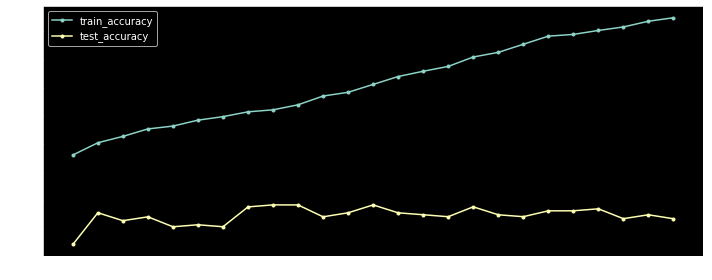

In [124]:
xgBoost_CVmetrics_df['train_accuracy'] = 1 - xgBoost_CVmetrics_df['train-error-mean']
xgBoost_CVmetrics_df['test_accuracy'] = 1 - xgBoost_CVmetrics_df['test-error-mean']

xgBoost_CVmetrics_df[ ['train_accuracy','test_accuracy'] ].plot( figsize= (10,4), marker= '.' )
plt.tight_layout()

#### CrossValidation with multiple metrics 

In [13]:
xgBoost_CVmetrics_df = xgb.cv(  params= paramDictn, dtrain= xy_Dmtrx, nfold= 10, num_boost_round= 25,
                                metrics= ['error','auc','rmse','mae'], as_pandas= True, shuffle= True  )

In [14]:
xgBoost_CVmetrics_df['test_accuracy'] = 1 - xgBoost_CVmetrics_df['test-error-mean']
xgBoost_CVmetrics_df

,train-error-mean,train-error-std,train-auc-mean,train-auc-std,train-rmse-mean,train-rmse-std,train-mae-mean,train-mae-std,test-error-mean,test-error-std,test-auc-mean,test-auc-std,test-rmse-mean,test-rmse-std,test-mae-mean,test-mae-std,test_accuracy
0,0.266392,0.019410,0.779901,0.007061,0.454953,0.002339,0.450129,0.002490,0.365610,0.091112,0.677043,0.080744,0.468944,0.014225,0.463822,0.013835,0.634390
1,0.234024,0.014143,0.825000,0.010194,0.426667,0.003640,0.413445,0.003983,0.326402,0.088662,0.717802,0.084619,0.448006,0.024799,0.434098,0.023859,0.673598
2,0.230459,0.011961,0.843750,0.009476,0.408335,0.004631,0.385911,0.005409,0.346159,0.088196,0.715622,0.086333,0.439423,0.029265,0.415500,0.027985,0.653841
3,0.218381,0.011908,0.859689,0.007129,0.395470,0.004982,0.364798,0.006020,0.326402,0.087206,0.713387,0.093337,0.434550,0.036470,0.401851,0.035055,0.673598
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21,0.106732,0.015612,0.962094,0.008280,0.308037,0.009822,0.244141,0.010760,0.308719,0.075783,0.729665,0.093271,0.433144,0.056390,0.345653,0.056456,0.691281
22,0.102066,0.015131,0.964567,0.006435,0.304710,0.008807,0.240725,0.010063,0.318414,0.070296,0.732262,0.085429,0.432818,0.055564,0.344659,0.055932,0.681585
23,0.099597,0.011707,0.967719,0.004520,0.300364,0.007945,0.236626,0.009685,0.305976,0.071176,0.733450,0.083453,0.432376,0.054832,0.343356,0.055695,0.694025
24,0.094655,0.014357,0.970311,0.004862,0.296928,0.008134,0.233133,0.009589,0.310915,0.076045,0.732744,0.077524,0.433927,0.053632,0.343208,0.055325,0.689085


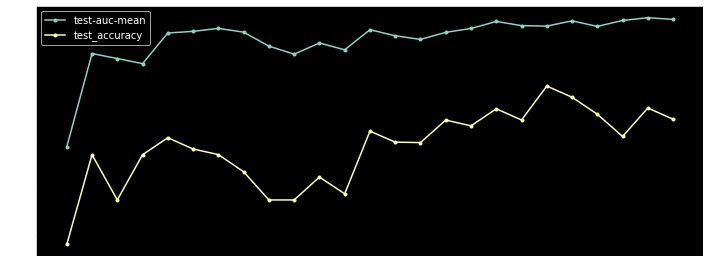

In [11]:
xgBoost_CVmetrics_df[ ['test-auc-mean','test_accuracy'] ].plot( figsize= (10,4), marker= '.' )
plt.tight_layout()

<hr><br>

## Regression with `XGBoost`

### Objective (loss) functions & base learners

<br>

In [167]:
boston_data = sklearn.datasets.load_boston()
x_boston_df = pd.DataFrame(  boston_data.data, columns= boston_data.feature_names  )
y_boston_df = pd.DataFrame(  boston_data.target, columns= ['house_price']  )

xtrn,xtst, ytrn,ytst = sklearn.model_selection.train_test_split( x_boston_df, y_boston_df, test_size= 25./100 )

print( ytrn.head(3), '\n\n', xtrn.shape, '\n'); xtrn.head(3)

     house_price
406         11.9
70          24.2
400          5.6 

 (379, 13) 



,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
406,20.71620,0.0,18.10,0.0,0.659,4.138,100.0,1.1781,24.0,666.0,20.2,370.22,23.34
70,0.08826,0.0,10.81,0.0,0.413,6.417,6.6,5.2873,4.0,305.0,19.2,383.73,6.72
400,25.04610,0.0,18.10,0.0,0.693,5.987,100.0,1.5888,24.0,666.0,20.2,396.90,26.77


#### Use `trees`  as ***base learners***

In [168]:
xgbTree = xgb.XGBRegressor( n_estimators= 50, objective= 'reg:squarederror', booster= 'gbtree', seed= 10 )
# <-- booster= 'gbtree' is default
xgbTree.fit( xtrn, ytrn )

yhat = xgbTree.predict( xtst )

RMSE = ( sklearn.metrics.mean_squared_error( ytst, yhat ) )**0.5

print( 'RMSE of XGBoost using Trees as Base-learners   -->   %f' % (RMSE) )

RMSE of XGBoost using Trees as Base-learners   -->   3.629763


#### USe `Linear learner` as *base learners*

`Linear learner`, although not as commonly used in XGBoost, allows to create a <b>regularized linear regression</b> using XGBoost's powerful learning API instead of scikit-learn wrapper.

Here we must create the parameter dictionary that describes the kind of booster to be adopted. The booster type (base model) to be adopted is `booster --> 'gblinear'`.

In [169]:
# convert pd df into dmatrix

xytrn_DMtrx = xgb.DMatrix( data= xtrn, label= ytrn );   xytst_DMtrx = xgb.DMatrix( data= xtst, label= ytst )

# param dictn
pDictn = { 'booster':'gblinear', 'objective':'reg:squarederror' }

# model fit
xgbLinr = xgb.train(  params= pDictn, dtrain= xytrn_DMtrx, num_boost_round= 100  )\
yhat = xgbLinr.predict( xytst_DMtrx )

# metrics
RMSE = (  sklearn.metrics.mean_squared_error( ytst, yhat )  )**0.5
print( 'RMSE of XGBoost using Linear learner as Base-learners   -->   %f' % (RMSE) )

RMSE of XGBoost using Linear learner as Base-learners   -->   2143.604594


<br>

###  `Regularization` & `Base learners` in XGBoost

<br>

Creating Data frame from (zipping) lists:

In [92]:
ls1 = [1,2,3]; ls2 = [ 'a','b','c' ] 

print( ls1, ls2, '  -->  ' ,  list( zip(ls1,ls2) )  )

zip(ls1,ls2)

[1, 2, 3] ['a', 'b', 'c']   -->   [(1, 'a'), (2, 'b'), (3, 'c')]


In [49]:
display_side_by_side( pd.DataFrame( zip(ls1,ls2) ) , pd.DataFrame( list( zip(ls1,ls2) )  )  ) 

0 
 1 
 
 
 
 
 0 
 1 
 a 
 
 
 1 
 2 
 b 
 
 
 2 
 3 
 c 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 0 
 1 
 
 
 
 
 0 
 1 
 a 
 
 
 1 
 2 
 b 
 
 
 2 
 3 
 c

<br>

### `Regularization`

In [282]:
house_df = pd.read_csv( location + 'ames_housing_trimmed_processed.csv' )

xtrn,xtst, ytrn,ytst = sklearn.model_selection.train_test_split( house_df.drop('SalePrice',axis=1),
                                                                 house_df['SalePrice'], test_size= 0.1/100 )
print( ytrn.head(3), '\n\n', xtrn.shape, '\n'); xtrn.head(3)

1367    127000
1026    167500
218     311500
Name: SalePrice, dtype: int64 

 (1458, 56) 



,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,Remodeled,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,Fireplaces,GarageArea,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,PavedDrive_P,PavedDrive_Y
1367,160,41.0,2665,5,6,1977,0,1475,0,0,2,0,4,1,336,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1
1026,20,73.0,9300,5,5,1960,0,1264,1,0,1,0,3,2,461,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
218,50,0.0,15660,7,9,1939,1,1954,0,1,1,1,3,2,431,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [283]:
# dMatrix

xytrn_DMtrx = xgb.DMatrix( data= xtrn, label= ytrn );   xytst_DMtrx = xgb.DMatrix( data= xtst, label= ytst )

# initial param dictn
pDictn = {  'objective': 'reg:squarederror', 'max_depth': 10   }

rmse_ls = []

lambda_ls =  np.logspace(-6,0,50)

# iter over lambda

for e_lambda in lambda_ls:
    
    pDictn['lambda'] = e_lambda
    
    # pass param with nascent k-v into cv
    xgb_CV  = xgb.cv(  params= pDictn, dtrain= xytrn_DMtrx,  num_boost_round= 3, nfold= 6, metrics= 'rmse',
                       as_pandas= True, seed= 10  )
    
    rmse_ls.append( xgb_CV['test-rmse-mean'].min() )
    
# convert lists to df

rmse_df = pd.DataFrame(  data= zip(lambda_ls,rmse_ls), columns= ['lambda_l2','rmse'] )

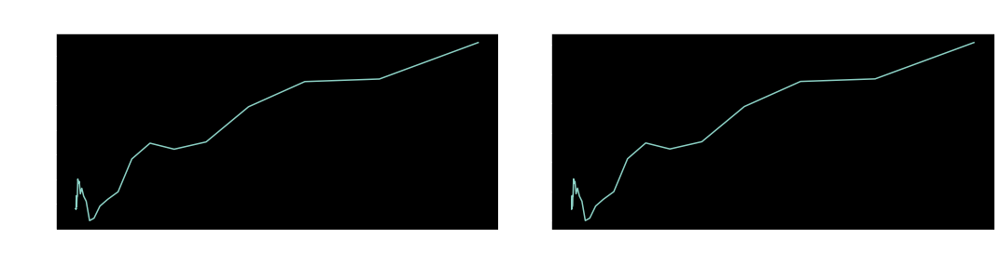

In [182]:
fg, ax = plt.subplots( 1,2, figsize= (15,4) )

ax[0].plot( rmse_df.lambda_l2, rmse_df.rmse );       ax[1].plot( rmse_df.lambda_l2, (rmse_df.rmse)**.8 )

ax[0].set( xlabel= 'lambda', ylabel= 'RMSE' );       ax[1].set( xlabel= 'lambda', ylabel= 'log(RMSE)'  )
fg.suptitle( 'RMSE score for different L2 Regularization', size= 14  )

# ax[1].set_yscale('log', base= 10)

plt.tight_layout(); plt.show()

<br>

### Visualizing individual XGBoost trees

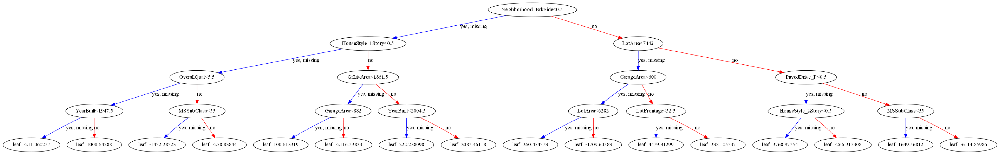

In [236]:
# model train/fit

total_trees = 50

pDictn = {  'objective':'reg:squarederror', 'max_depth':4, 'lambda':0.02  }

xgb_Reg_est = xgb.train(  params= pDictn, dtrain= xytrn_DMtrx, num_boost_round= total_trees  )

fg,ax = plt.subplots( figsize= (80,10) )

xgb.plot_tree( booster= xgb_Reg_est, ax= ax,
               num_trees= total_trees - 1  # <- last tree              
             )
plt.tight_layout()

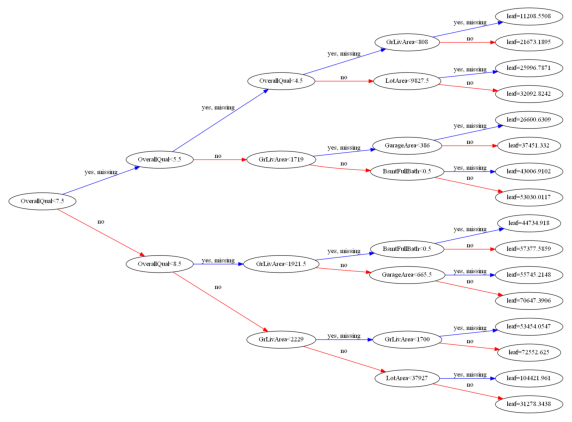

In [237]:
fg,ax = plt.subplots( figsize= (10,10) )

xgb.plot_tree( booster= xgb_Reg_est, ax= ax, num_trees= 1, rankdir= 'LR'   # <-- sideways
             )
plt.show()

### Visualizing feature importances

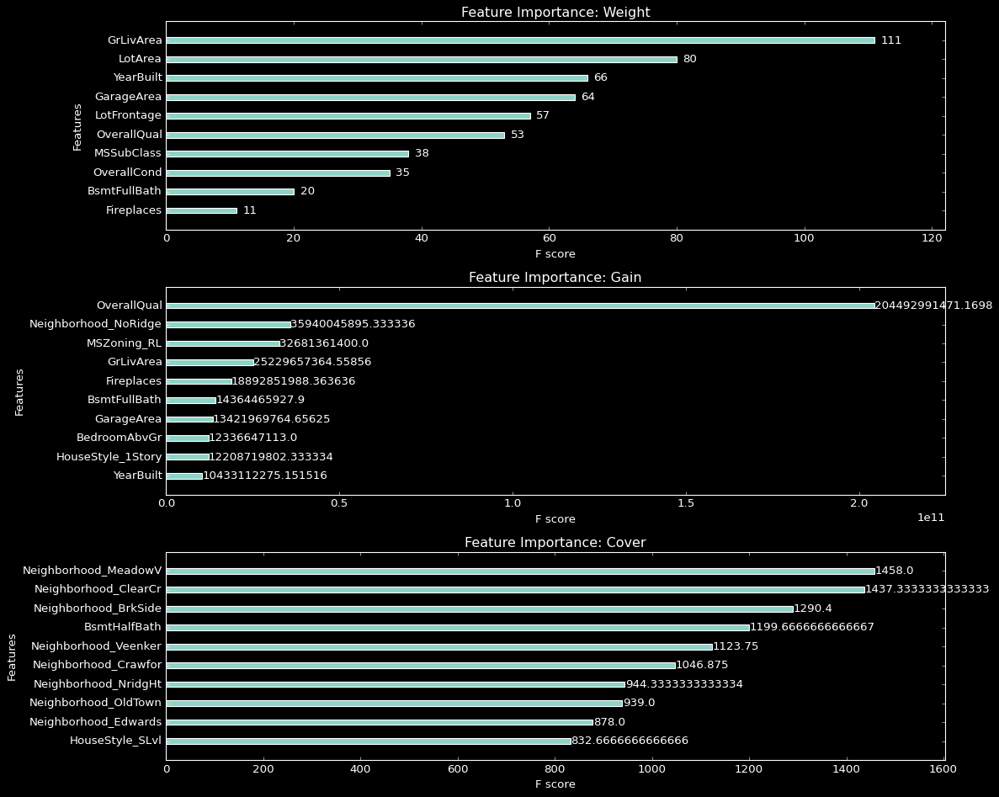

In [270]:
plt.style.use('dark_background')

fg,ax = plt.subplots( 3,1, figsize= (15,4*3) )

xgb.plot_importance(  booster= xgb_Reg_est, height= .3, max_num_features= 10, grid= False,
                      importance_type= 'weight', ax= ax[0], title= 'Feature Importance: Weight'  )
xgb.plot_importance(  booster= xgb_Reg_est, height= .3, max_num_features= 10, grid= False,
                      importance_type= 'gain',   ax= ax[1], title= 'Feature Importance: Gain'  )
xgb.plot_importance(  booster= xgb_Reg_est, height= .3, max_num_features= 10, grid= False,
                      importance_type= 'cover',  ax= ax[2], title= 'Feature Importance: Cover'  )

plt.tight_layout();  plt.show()

<hr><br>
<div id= '5.3'></div>

## Fine-tuning XGBoost model

<br>

###  `Early Stopping`

In [286]:
house_df = pd.read_csv( location + 'ames_housing_trimmed_processed.csv' )

xtrn,xtst, ytrn,ytst = sklearn.model_selection.train_test_split(  house_df.drop('SalePrice',axis=1),
                                                                  house_df['SalePrice'], test_size= 0.1/100  )
print( ytrn.head(2), '\n\n', xtrn.shape); xtrn.head(2)

878    148000
700    312500
Name: SalePrice, dtype: int64 

 (1458, 56)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,Remodeled,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,Fireplaces,GarageArea,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,PavedDrive_P,PavedDrive_Y
878,85,88.0,11782,5,7,1961,1,1155,1,0,1,0,3,0,576,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
700,20,85.0,14331,8,5,2002,0,1800,1,0,2,0,3,1,765,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1


#### Manual RMSE score for different no. of Ensemble Trees & different no. of Tree Depths

In [306]:
xytrn_DMtrx = xgb.DMatrix( xtrn, ytrn )

HparamSpace = {   'objective':'reg:squarederror', 'max_depth': 4   }

ensembleTrees = np.arange( 5,30,3 )

rmse_ls = []

for e_eT in ensembleTrees:
    
    xgb_CV = xgb.cv(   params= HparamSpace, dtrain= xytrn_DMtrx, num_boost_round= e_eT, nfold= 7,
                       metrics= 'rmse', as_pandas= True, seed= 10   )
    rmse_ls.append( xgb_CV['test-rmse-mean'].iloc[-1] )
    
rmse_eT_df = pd.DataFrame( data= zip(ensembleTrees,rmse_ls), columns= ['ensembleTress_num','rmse_eT']  )    

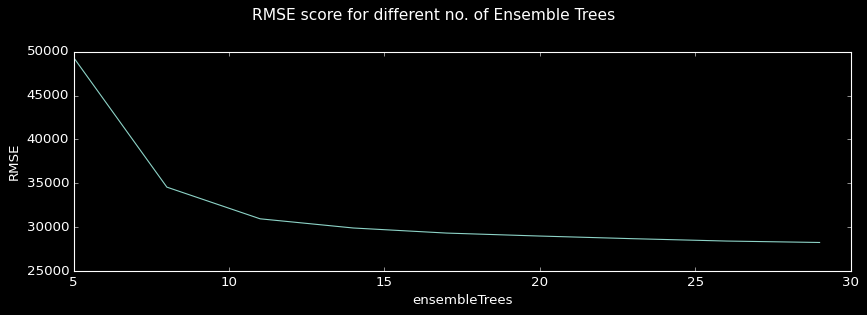

In [307]:
fg, ax = plt.subplots( figsize= (11,4) )

ax.plot( rmse_eT_df.ensembleTress_num, rmse_eT_df.rmse_eT )

ax.set( xlabel= 'ensembleTrees', ylabel= 'RMSE' )
fg.suptitle( 'RMSE score for different no. of Ensemble Trees', size= 14  )

plt.tight_layout(); plt.show()

In [383]:
# RMSE for different Tree depth for ensembleTree no = 20

ensembleTree = 20

xytrn_DMtrx = xgb.DMatrix( xtrn, ytrn )

HparamSpace = { 'objective':'reg:squarederror' }

treeDepth_max_ls = np.arange( 1,11 )

rmse_ls = []

for e_dt in treeDepth_max_ls:
    
    HparamSpace['max_depth'] = e_dt
    
    xgb_CV = xgb.cv(   params= HparamSpace, dtrain= xytrn_DMtrx, num_boost_round= ensembleTree,
                       nfold= 7, metrics= 'rmse', as_pandas= True  )
    
    rmse_ls.append( xgb_CV['test-rmse-mean'].iloc[-1] )
    
rmse_dT_df = pd.DataFrame( data= zip(treeDepth_max_ls,rmse_ls), columns= ['treeDepth','rmse_dT']  )

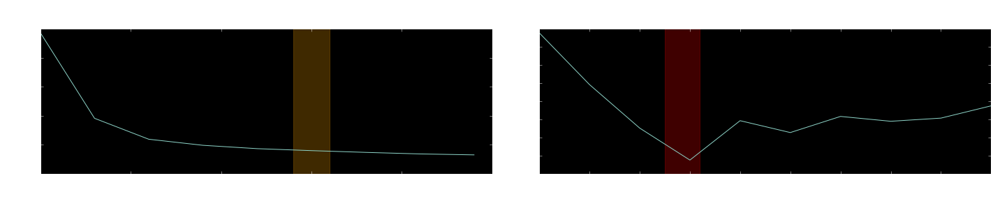

In [386]:
fg, ax = plt.subplots( 1,2, figsize= (20,4) )

ax[0].plot( rmse_eT_df.ensembleTress_num, rmse_eT_df.rmse_eT )
ax[1].plot( rmse_dT_df.treeDepth, rmse_dT_df.rmse_dT )

ax[0].axvspan( xmin= ensembleTree-1, xmax= ensembleTree+1, alpha= 0.25, color= 'orange'  )
ax[1].axvspan( xmin= 3.5, xmax= 4.2, alpha= 0.25, color= 'red'  )

ax[0].set( xlabel= '# ensembleTrees', ylabel= 'RMSE' );
ax[1].set( xlabel= '# treeDepth', ylabel= 'RMSE' )
fg.suptitle( 'RMSE score for different ' + str(ensembleTree) + ' Ensemble Trees & different Tree Depths', size= 14  )
plt.tight_layout(); plt.show()

<br>

### `Early Stopping` for best RMSE score for different no. of Ensemble Trees 

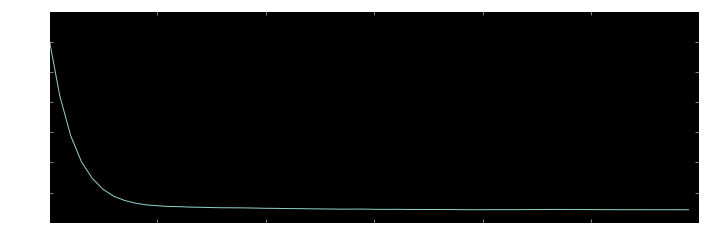

In [392]:
xytrn_DMtrx = xgb.DMatrix( xtrn, ytrn )

HparamSpace = {   'objective':'reg:squarederror', 'max_depth':4   }

xgb_CV = xgb.cv(  params= HparamSpace, dtrain= xytrn_DMtrx, nfold= 7, num_boost_round= 500, as_pandas= True,
                  early_stopping_rounds= 50  # <-- Early Stopping
               )

## plot
xgb_CV['test-rmse-mean'].plot(  figsize= (10,3.5) ); plt.tight_layout(); plt.show()

#### RMSE for different Tree depth for ensembleTrees no = 60 ( 60 is the # of EnsembleTrees value obtained from `EarlyStopping` )

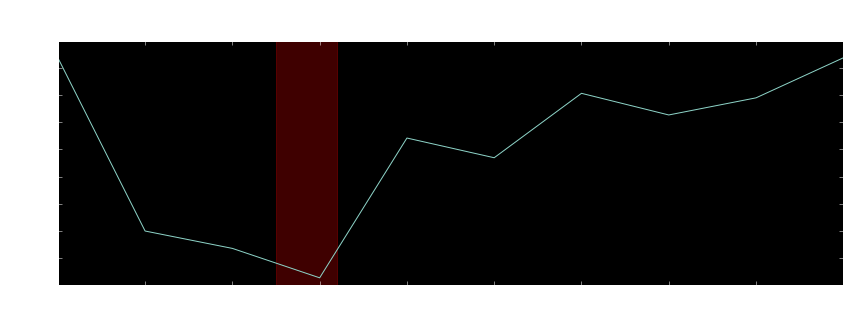

In [391]:
## RMSE for different Tree depth for ensembleTree no = 60

ensembleTree = xgb_CV.shape[0]

xytrn_DMtrx = xgb.DMatrix( xtrn, ytrn )
HparamSpace = { 'objective':'reg:squarederror' }
treeDepth_max_ls = np.arange( 1,11 )
rmse_ls = []

for e_dt in treeDepth_max_ls:    
    HparamSpace['max_depth'] = e_dt    
    xgb_CV = xgb.cv(   params= HparamSpace, dtrain= xytrn_DMtrx, num_boost_round= ensembleTree,
                       nfold= 7, metrics= 'rmse', as_pandas= True   )    
    rmse_ls.append( xgb_CV['test-rmse-mean'].iloc[-1] )
    
rmse_dT_df = pd.DataFrame( data= zip(treeDepth_max_ls,rmse_ls), columns= ['treeDepth','rmse_dT']  )

## plots

fg, ax = plt.subplots( figsize= (12,4.5) )

ax.plot( rmse_dT_df.treeDepth, rmse_dT_df.rmse_dT )

ax.axvspan( xmin= 3.5, xmax= 4.2, alpha= 0.25, color= 'red'  )
ax.set( xlabel= '# treeDepth', ylabel= 'RMSE' )
fg.suptitle( 'RMSE score for ' + str(ensembleTree) + ' Ensemble Trees & different Tree Depths', size= 14  )
plt.tight_layout(); plt.show()

This is significantly lower than previous `#treeDepth vs RMSE` plot ( ~ 29000 vs. ~30000 ) for # treesDepth = 4.

Depth is sometimes necessary to capture interactions between features i.e. it allows the possibility for more complicated interactions. Here, in this example depth = 4 allows for necessary and beneficial interaction among variables.

<br>

### Hyperparameter Tuning adopting `GridSearch` & `RandomSearch`

##### XGBoost for Tree: Hyperparameters

In [166]:
## data
house_df = pd.read_csv( location + 'ames_housing_trimmed_processed.csv' )

xtrn,xtst, ytrn,ytst = sklearn.model_selection.train_test_split(  house_df.drop('SalePrice',axis=1),
                                                                  house_df['SalePrice'], test_size= 0.1/100  )

# DMatrix
xytrn_DMtrx = xgb.DMatrix( xtrn, ytrn )

print( ytrn.head(2), '\n', xtrn.shape); xtrn.head(2)

1001     86000
772     107000
Name: SalePrice, dtype: int64 
 (1458, 56)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,Remodeled,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,Fireplaces,GarageArea,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,PavedDrive_P,PavedDrive_Y
1001,30,60.0,5400,5,6,1920,1,691,0,0,1,0,2,0,216,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
772,80,94.0,7819,6,5,1976,0,1117,1,0,1,0,3,1,672,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1


<br>

### Hyperparameter tuning implemented by `for-loop`

In [167]:
# hyper parameter space

l2reg = np.logspace(-3,1, num= 5)
gam = np.arange( 0,500,100 )
treeDepth_max = np.arange( 1,10,2 )
subsample_obv = np.arange( 0,1.2,0.3 )
subsample_col = np.arange( 0,1.2,0.3 )
tree_num = np.arange( 5,300,70 )
learning_rate_eta =  np.arange( 0,1.2,0.3 )

# ------------------------- Shortened Hparam space --------------------------------------

l2reg = np.logspace(-3,1, num= 3)
gam = np.arange( 0,500,200 )
treeDepth_max = np.arange( 2,10,5 )
subsample_obv = np.arange( 0,1.2,0.4 )
subsample_col = np.arange( 0,1.2,0.4 )
tree_num = np.arange( 5,300,100 )
learning_rate_eta =  np.arange( 0,1.2,0.5 )


print( 'No of params for each Hyperparam -->  ', len(l2reg), len(gam), len(treeDepth_max) , len(subsample_obv),
                                                 len(subsample_col) , len(tree_num) , len(learning_rate_eta),\
       '\nTotal hyperparams -->  ', len(l2reg) * len(gam) *  len(treeDepth_max) * len(subsample_obv) * len(subsample_col) * len(tree_num)* len(learning_rate_eta) )

No of params for each Hyperparam -->   3 3 2 3 3 3 3 
Total hyperparams -->   1458


In [195]:
## creating Hyper parameter Grid for CPU & GPU

HparamSpace = {    'learning_rate':learning_rate_eta, 'gamma':gam, 'lambda':l2reg,
                   'max_depth':treeDepth_max, 'n_estimators':tree_num,
                   'subsample': subsample_obv, 'colsample_bytree':subsample_col,
                   'objective':['reg:squarederror']                                         }

# CPU & GPU Hparam space dictn

HparamSpace_CPU = copy.deepcopy( HparamSpace )
HparamSpace_CPU['tree_method'] = ['hist']

HparamSpace_GPU = copy.deepcopy( HparamSpace )
HparamSpace_GPU['tree_method'] = ['gpu_hist']

# create hyperparam grid for CPU & GPU
HparamGrd_CPU = sklearn.model_selection.ParameterGrid( param_grid= HparamSpace_CPU )
HparamGrd_GPU = sklearn.model_selection.ParameterGrid( param_grid= HparamSpace_GPU )

In [196]:
## iterate through all hyperparams for CPU & GPU

time_CPU = []

# fit using CPU

for e_Hp in HparamGrd_CPU:
    
    xgb_est = xgb.XGBRegressor( **e_Hp )    
    start_time = time.time()    
    xgb_est.fit( xtrn,ytrn )    
    time_CPU.append( time.time() - start_time )    

In [198]:
# fit using GPU

time_GPU = []

for e_Hp in HparamGrd_GPU:
    
    xgb_est = xgb.XGBRegressor( **e_Hp )    
    start_time = time.time()    
    xgb_est.fit( xtrn, ytrn )    
    time_GPU.append( time.time() - start_time )

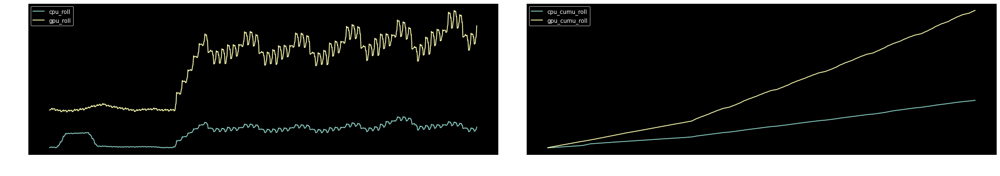

In [234]:
time_df = pd.DataFrame( zip(time_CPU,time_GPU), columns= ['cpu','gpu'] )

## cumulative
time_df['cpu_cumu'] = time_df.cpu.cumsum();       time_df['gpu_cumu'] = time_df.gpu.cumsum()

## rolling mean

roll_period = 100;  roll_cumu_time = 15

time_df['cpu_roll'] = time_df.cpu.rolling( window= roll_period ).mean()
time_df['gpu_roll'] = time_df.gpu.rolling( window= roll_period ).mean()
time_df['cpu_cumu_roll'] = time_df.cpu_cumu.rolling( window= roll_cumu_time ).mean()
time_df['gpu_cumu_roll'] = time_df.gpu_cumu.rolling( window= roll_cumu_time ).mean()

## plots

fg,ax = plt.subplots( 1,2, figsize= (25,4.5) )

time_df[ ['cpu_roll','gpu_roll'] ].plot( ax= ax[0] )
time_df[ ['cpu_cumu_roll','gpu_cumu_roll'] ].plot( ax= ax[1] )

ax[0].set( xlabel= '# Step of hyper parameter tuning', ylabel= 'time taken (sec)' )
ax[1].set( xlabel= '# Step of hyper parameter tuning', ylabel= 'time taken cumulative(sec)' )

plt.tight_layout(); plt.show()

<br>

### Hyperparameter tuning adopting `GridSearchCV`

Non-parallel CPU

In [ ]:
xgb_est = xgb.XGBRegressor()

xgb_GrdSrc = sklearn.model_selection.GridSearchCV( estimator= xgb_est, param_grid= HparamSpace_CPU,
                                                   scoring= 'neg_mean_squared_error', cv= 2, verbose= 1 )

%time xgb_GrdSrc.fit( xtrn, ytrn )

Parallel CPU

In [240]:
xgb_est = xgb.XGBRegressor( n_jobs= -1 )

xgb_GrdSrc = sklearn.model_selection.GridSearchCV( estimator= xgb_est, param_grid= HparamSpace_CPU,
                                                   scoring= 'neg_mean_squared_error', cv= 2, verbose= 1, n_jobs= -1 )
%time xgb_GrdSrc.fit( xtrn, ytrn )

Fitting 2 folds for each of 1458 candidates, totalling 2916 fits
Wall time: 1min 5s


GridSearchCV(cv=2,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=...
             n_jobs=-1,
             param_grid={'colsample_bytree': array([0. , 0.4, 0.8]),
                         'gamma': array([  0, 200, 400]),
                         'lambda': array([1.e-03, 1.e-01, 1.e+01]),
                         'learning_rate': array([0. , 0.5, 1. ]),
       

<br>

### `RandomizedSearchCV`

In [5]:
l2reg = np.logspace(-3,1, num= 5)
gam = np.arange( 0,500,100 )
treeDepth_max = np.arange( 1,10,2 )
subsample_obv = np.arange( 0,1.2,0.3 )
subsample_col = np.arange( 0,1.2,0.3 )
tree_num = np.arange( 5,300,70 )
learning_rate_eta =  np.arange( 0,1.2,0.3 )


print( 'No of params for each Hyperparam -->  ', len(l2reg), len(gam), len(treeDepth_max) , len(subsample_obv) , len(subsample_col) , len(tree_num) , len(learning_rate_eta),\
       '\nTotal hyperparams -->  ', len(l2reg) * len(gam) *  len(treeDepth_max) * len(subsample_obv) * len(subsample_col) * len(tree_num)* len(learning_rate_eta) )

No of params for each Hyperparam -->   5 5 5 4 4 5 4 
Total hyperparams -->   40000


In [315]:
# hyper parameter space

l2reg = np.logspace(-3,1, num= 5)
gam = np.arange( 0,500,300 )
treeDepth_max = np.arange( 1,10,2 )
subsample_obv = np.arange( 0,1.2,0.3 )
subsample_col = np.arange( 0,1.2,0.3 )
tree_num = np.arange( 5,300,70 )
learning_rate_eta =  np.arange( 0,1.2,0.3 )

HparamSpace = {  'lambda':l2reg, 'gamma':gam, 'max_depth':treeDepth_max,
                 'subsample': subsample_obv, 'colsample_bytree':subsample_col,
                 'n_estimators':tree_num, 'learning_rate':learning_rate_eta,
                 'objective':['reg:squarederror']  }

all_HparamGrd = sklearn.model_selection.ParameterGrid( param_grid= HparamSpace )
len_Hparam = len(all_HparamGrd)
print( 'Total number of hyper parameters   -->  ', len_Hparam )

xgb_est = xgb.XGBRegressor( n_jobs= -1 )

xgb_RndmSrc = sklearn.model_selection.RandomizedSearchCV( estimator= xgb_est, param_distributions= HparamSpace,
                                                          scoring= 'neg_mean_squared_error',
                                                          n_iter= len_Hparam*20//100, cv= 5, n_jobs= -1 
                                                          # <-- number of iterations
                                                        )

Total number of hyper parameters   -->   40000


In [3]:
# %time xgb_RndmSrc.fit( xtrn, ytrn )

In [276]:
xgb_RndmSrc.cv_results_.keys()

dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_subsample', 'param_objective', 'param_n_estimators', 'param_max_depth', 'param_learning_rate', 'param_lambda', 'param_gamma', 'param_colsample_bytree', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score'])

In [282]:
print( 'Best Hparams -->\n', xgb_RndmSrc.best_params_ )

print( '\nLowest RMSE found  -->  ', np.round( np.sqrt(np.abs(xgb_RndmSrc.best_score_)),2) )

Best Hparams -->
 {'subsample': 0.8999999999999999, 'objective': 'reg:squarederror', 'n_estimators': 75, 'max_depth': 3, 'learning_rate': 0.3, 'lambda': 1.0, 'gamma': 200, 'colsample_bytree': 0.6}

Lowest RMSE found  -->   27420.83


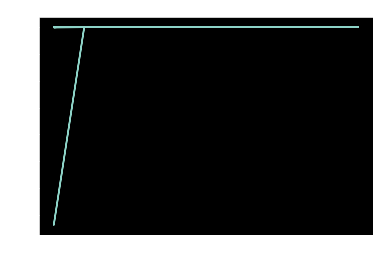

In [272]:
plt.plot( xgb_RndmSrc.cv_results_['param_lambda'].data, xgb_RndmSrc.cv_results_['mean_test_score'] )

<hr><br>

## Using XGBoost in pipelines

><pre>- Incorporating XGBoost models into end-to-end ML pipelines
> - Tune significant XGBoost hyperparameters efficiently within a pipeline
> - Advanced preprocessing techniques</pre>

<br>

### Encoding Categorical columns:  &emsp; `Ordinal Encoder` &emsp;|&emsp; `OneHotEncoder`  &emsp;|&emsp; `DictVectorizer`


</b><p>


In [193]:
housing_df = pd.read_csv( location + 'ames_housing_train.csv', index_col= [0] )
housing_df.head(3); 

#### data cleaning

In [194]:
pd.set_option('display.max_rows', None)

print( housing_df.isna().sum().sort_values( ascending= False )[:23] )

colm_toBeRemoved  =  housing_df.isna().sum().sort_values( ascending= False )[:6].index
missing_colm_ls   =  housing_df.isna().sum().sort_values( ascending= False )[6:19].index

pd.options.display.max_rows = 6

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
FireplaceQu      690
LotFrontage      259
GarageType        81
GarageCond        81
GarageFinish      81
GarageQual        81
GarageYrBlt       81
BsmtFinType2      38
BsmtExposure      38
BsmtQual          37
BsmtCond          37
BsmtFinType1      37
MasVnrArea         8
MasVnrType         8
Electrical         1
RoofMatl           0
Exterior1st        0
RoofStyle          0
ExterQual          0
dtype: int64


In [185]:
housing_df[ missing_colm_ls ].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 1 to 1460
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   GarageType    1379 non-null   object 
 1   GarageCond    1379 non-null   object 
 2   GarageFinish  1379 non-null   object 
 3   GarageQual    1379 non-null   object 
 4   GarageYrBlt   1379 non-null   float64
 5   BsmtFinType2  1422 non-null   object 
 6   BsmtExposure  1422 non-null   object 
 7   BsmtQual      1423 non-null   object 
 8   BsmtCond      1423 non-null   object 
 9   BsmtFinType1  1423 non-null   object 
 10  MasVnrArea    1452 non-null   float64
 11  MasVnrType    1452 non-null   object 
 12  Electrical    1459 non-null   object 
dtypes: float64(2), object(11)
memory usage: 159.7+ KB


In [195]:
# remove bad features 

housing_df.drop( colm_toBeRemoved, axis= 1, inplace= True )

housing_cpy = housing_df.copy( deep= True )

In [106]:
housing_cpy[ missing_colm_ls ].head(3)

,GarageType,GarageCond,GarageFinish,GarageQual,GarageYrBlt,BsmtFinType2,BsmtExposure,BsmtQual,BsmtCond,BsmtFinType1,MasVnrArea,MasVnrType,Electrical
Id,,,,,,,,,,,,,
1,Attchd,TA,RFn,TA,2003.0,Unf,No,Gd,TA,GLQ,196.0,BrkFace,SBrkr
2,Attchd,TA,RFn,TA,1976.0,Unf,Gd,Gd,TA,ALQ,0.0,None,SBrkr
3,Attchd,TA,RFn,TA,2001.0,Unf,Mn,Gd,TA,GLQ,162.0,BrkFace,SBrkr


In [196]:
# segregating categorical & numerical columns with missing values 

miss_numr_colm = housing_cpy[missing_colm_ls].select_dtypes( exclude= ['object'] ).columns.tolist()
miss_cat_colm =  housing_cpy[missing_colm_ls].select_dtypes( include= ['object'] ).columns.tolist()

print( 'Numerical Columns --> \n', housing_cpy[missing_colm_ls].select_dtypes( exclude= ['object'] ).head(3),
       '\n\n\nCategorical Columns -->' )

housing_cpy[missing_colm_ls].select_dtypes( include= ['object'] ).head(3)

Numerical Columns --> 
     GarageYrBlt  MasVnrArea
Id                         
1        2003.0       196.0
2        1976.0         0.0
3        2001.0       162.0 


Categorical Columns -->


,GarageType,GarageCond,GarageFinish,GarageQual,BsmtFinType2,BsmtExposure,BsmtQual,BsmtCond,BsmtFinType1,MasVnrType,Electrical
Id,,,,,,,,,,,
1,Attchd,TA,RFn,TA,Unf,No,Gd,TA,GLQ,BrkFace,SBrkr
2,Attchd,TA,RFn,TA,Unf,Gd,Gd,TA,ALQ,None,SBrkr
3,Attchd,TA,RFn,TA,Unf,Mn,Gd,TA,GLQ,BrkFace,SBrkr


<br>

#### 2 steps: `Ordinal Encoder` (optional)  & `OneHotEncoded`

`Ordinal Encoder` is only relevant if we have ordinal data

In [199]:
# drop all rows with any missing vlaues for now

housing_cpy.dropna( axis=0, how= 'any', inplace= True )

housing_cpy2 = housing_cpy.copy( deep= True )
housing_cpy3 = housing_cpy.copy( deep= True )

In [201]:
# using apply method and LabelEncoder: LabelEncoder is for the target variable & not for features (often a 1D array)
#- not a good approach

lblEncObj = sklearn.preprocessing.LabelEncoder()

housing_cpy[miss_cat_colm] = housing_cpy[miss_cat_colm].apply( lambda colm: lblEncObj.fit_transform(colm) )
housing_cpy[miss_cat_colm].head()

,GarageType,GarageCond,GarageFinish,GarageQual,BsmtFinType2,BsmtExposure,BsmtQual,BsmtCond,BsmtFinType1,MasVnrType,Electrical
Id,,,,,,,,,,,
1,1,4,1,4,5,3,2,3,2,1,4
2,1,4,1,4,5,1,2,3,0,2,4
3,1,4,1,4,5,2,2,3,2,1,4
4,5,4,2,4,5,3,3,1,0,2,4
5,1,4,1,4,5,0,2,3,2,1,4


In [206]:
# using Ordinal Encoder as it is for the "features" (often a 2D array) - Good approach

ordEncoder = sklearn.preprocessing.OrdinalEncoder( dtype= np.int8 )

housing_cpy2[miss_cat_colm] = ordEncoder.fit_transform( housing_cpy2[miss_cat_colm] )

housing_cpy2[miss_cat_colm].head()

,GarageType,GarageCond,GarageFinish,GarageQual,BsmtFinType2,BsmtExposure,BsmtQual,BsmtCond,BsmtFinType1,MasVnrType,Electrical
Id,,,,,,,,,,,
1,1,4,1,4,5,3,2,3,2,1,4
2,1,4,1,4,5,1,2,3,0,2,4
3,1,4,1,4,5,2,2,3,2,1,4
4,5,4,2,4,5,3,3,1,0,2,4
5,1,4,1,4,5,0,2,3,2,1,4


In [208]:
# 2nd step One Hot Encoded

OHEncoder = sklearn.preprocessing.OneHotEncoder( sparse= False, drop= 'first', dtype= np.int8 )

OHEncoded_np = OHEncoder.fit_transform( housing_cpy[miss_cat_colm] )

OHEncoded_df = pd.DataFrame( OHEncoded_np, index= housing_cpy.index,
                             columns= OHEncoder.get_feature_names(miss_cat_colm) )
# the index helps to join with original df

OHEncoded_df.head()

,GarageType_1,GarageType_2,GarageType_3,GarageType_4,GarageType_5,GarageCond_1,GarageCond_2,GarageCond_3,GarageCond_4,GarageFinish_1,GarageFinish_2,GarageQual_1,GarageQual_2,GarageQual_3,GarageQual_4,BsmtFinType2_1,BsmtFinType2_2,BsmtFinType2_3,BsmtFinType2_4,BsmtFinType2_5,BsmtExposure_1,BsmtExposure_2,BsmtExposure_3,BsmtQual_1,BsmtQual_2,BsmtQual_3,BsmtCond_1,BsmtCond_2,BsmtCond_3,BsmtFinType1_1,BsmtFinType1_2,BsmtFinType1_3,BsmtFinType1_4,BsmtFinType1_5,MasVnrType_1,MasVnrType_2,MasVnrType_3,Electrical_1,Electrical_2,Electrical_3,Electrical_4
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1
2,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1
3,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1
4,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
5,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1


In [209]:
# Combining with original df: droping categorical columns & merging OneHotEncoded values

housing_cpy = housing_cpy.drop( miss_cat_colm, axis= 1 ).merge( OHEncoded_df, left_index= True, right_index= True )
housing_cpy.head()

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,GarageType_1,GarageType_2,GarageType_3,GarageType_4,GarageType_5,GarageCond_1,GarageCond_2,GarageCond_3,GarageCond_4,GarageFinish_1,GarageFinish_2,GarageQual_1,GarageQual_2,GarageQual_3,GarageQual_4,BsmtFinType2_1,BsmtFinType2_2,BsmtFinType2_3,BsmtFinType2_4,BsmtFinType2_5,BsmtExposure_1,BsmtExposure_2,BsmtExposure_3,BsmtQual_1,BsmtQual_2,BsmtQual_3,BsmtCond_1,BsmtCond_2,BsmtCond_3,BsmtFinType1_1,BsmtFinType1_2,BsmtFinType1_3,BsmtFinType1_4,BsmtFinType1_5,MasVnrType_1,MasVnrType_2,MasVnrType_3,Electrical_1,Electrical_2,Electrical_3,Electrical_4
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,706,0,150,856,GasA,Ex,Y,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,2003.0,2,548,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1
2,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,978,0,284,1262,GasA,Ex,Y,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,1976.0,2,460,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1
3,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,486,0,434,920,GasA,Ex,Y,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,2001.0,2,608,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458,70,RL,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,0.0,Ex,Gd,Stone,275,0,877,1152,GasA,Ex,Y,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,1941.0,1,252,Y,0,60,0,0,0,0,2500,5,2010,WD,Normal,266500,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1
1459,20,RL,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,49,1029,0,1078,GasA,Gd,Y,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,1950.0,1,240,Y,366,0,112,0,0,0,0,4,2010,WD,Normal,142125,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0
1460,20,RL,9937,Pave,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,0.0,Gd,TA,CBlock,830,290,136,1256,GasA,Gd,Y,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,1965.0,1,276,Y,736,68,0,0,0,0,0,6,2008,WD,Normal,147500,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1


#### Best approach: 1 step using One Hot Encoding

In [212]:
OHEncoder = sklearn.preprocessing.OneHotEncoder( sparse= False, drop= 'first', dtype= np.int8 )
OHEncoded_np = OHEncoder.fit_transform( housing_cpy2[miss_cat_colm] )
OHEncoded_df = pd.DataFrame( OHEncoded_np, index= housing_cpy2.index, columns= OHEncoder.get_feature_names(miss_cat_colm) )

housing_cpy2 = housing_cpy2.drop( miss_cat_colm, axis= 1 ).merge( OHEncoded_df, left_index= True, right_index= True )

housing_cpy2.head()

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,GarageType_1,GarageType_2,GarageType_3,GarageType_4,GarageType_5,GarageCond_1,GarageCond_2,GarageCond_3,GarageCond_4,GarageFinish_1,GarageFinish_2,GarageQual_1,GarageQual_2,GarageQual_3,GarageQual_4,BsmtFinType2_1,BsmtFinType2_2,BsmtFinType2_3,BsmtFinType2_4,BsmtFinType2_5,BsmtExposure_1,BsmtExposure_2,BsmtExposure_3,BsmtQual_1,BsmtQual_2,BsmtQual_3,BsmtCond_1,BsmtCond_2,BsmtCond_3,BsmtFinType1_1,BsmtFinType1_2,BsmtFinType1_3,BsmtFinType1_4,BsmtFinType1_5,MasVnrType_1,MasVnrType_2,MasVnrType_3,Electrical_1,Electrical_2,Electrical_3,Electrical_4
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,706,0,150,856,GasA,Ex,Y,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,2003.0,2,548,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1
2,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,978,0,284,1262,GasA,Ex,Y,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,1976.0,2,460,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1
3,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,486,0,434,920,GasA,Ex,Y,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,2001.0,2,608,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1
4,70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,0.0,TA,TA,BrkTil,216,0,540,756,GasA,Gd,Y,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,1998.0,3,642,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
5,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,350.0,Gd,TA,PConc,655,0,490,1145,GasA,Ex,Y,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,2000.0,3,836,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1


> ### `Ordinal Encoder`
<pre>OrdinalEncoder class accepts an argument called categories, which can be utilized to determine/assign the resulting order.</pre>

In [229]:
ordata_df = pd.read_csv( location + 'ordinal-data-example.csv' )

ord_colm = [ 'tempr','speed' ]

ordata_df.head()

,participant,tempr,speed
0,1,cold,slow
1,2,cold,slow
2,3,very hot,rapid
3,4,warm,fast
4,5,hot,fast


In [230]:
# create lists of ordinal values in the required relevant order ( order of the list and the element inside both are vital )

ordinalOrder = []

ordinalOrder = [ ['cold','warm','hot','very hot']  ]
ordinalOrder.append( ['slow','fast','rapid'] )

print( ordinalOrder )

# Ordinal Encoder

ordEncoder =  sklearn.preprocessing.OrdinalEncoder( categories= ordinalOrder, dtype= np.int )

ordata_df[ord_colm] = ordEncoder.fit_transform( ordata_df[ord_colm] )

ordata_df.head()

[['cold', 'warm', 'hot', 'very hot'], ['slow', 'fast', 'rapid']]


,participant,tempr,speed
0,1,0,0
1,2,0,0
2,3,3,2
3,4,1,1
4,5,2,1


<br>

### `DictVectorizer`

To use `DictVectorizer`, we need a dictionary (rather than a df) which will do both label encoding as well as one-hot encoding in one go. 

In [259]:
# Convert df into a dictn
housing_dictn = housing_cpy3[miss_cat_colm].to_dict( orient= 'records' )

# Create the DictnVectorizer object and fit-transform
dictnVect_obj = sklearn.feature_extraction.DictVectorizer( sparse= False, dtype= np.int8 )
dictnVect_mtrx = dictnVect_obj.fit_transform( housing_dictn )

# dictn matrix to df
dictnVect_df = pd.DataFrame( dictnVect_mtrx, index= housing_cpy3.index, columns= dictnVect_obj.feature_names_ )

# merge with original df 
housing_cpy3 = housing_cpy3.drop( miss_cat_colm, axis= 1 ).merge( dictnVect_df, left_index= True, right_index= True )

housing_cpy3.head(3)

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,BsmtCond=Fa,BsmtCond=Gd,BsmtCond=Po,BsmtCond=TA,BsmtExposure=Av,BsmtExposure=Gd,BsmtExposure=Mn,BsmtExposure=No,BsmtFinType1=ALQ,BsmtFinType1=BLQ,BsmtFinType1=GLQ,BsmtFinType1=LwQ,BsmtFinType1=Rec,BsmtFinType1=Unf,BsmtFinType2=ALQ,BsmtFinType2=BLQ,BsmtFinType2=GLQ,BsmtFinType2=LwQ,BsmtFinType2=Rec,BsmtFinType2=Unf,BsmtQual=Ex,BsmtQual=Fa,BsmtQual=Gd,BsmtQual=TA,Electrical=FuseA,Electrical=FuseF,Electrical=FuseP,Electrical=Mix,Electrical=SBrkr,GarageCond=Ex,GarageCond=Fa,GarageCond=Gd,GarageCond=Po,GarageCond=TA,GarageFinish=Fin,GarageFinish=RFn,GarageFinish=Unf,GarageQual=Ex,GarageQual=Fa,GarageQual=Gd,GarageQual=Po,GarageQual=TA,GarageType=2Types,GarageType=Attchd,GarageType=Basment,GarageType=BuiltIn,GarageType=CarPort,GarageType=Detchd,MasVnrType=BrkCmn,MasVnrType=BrkFace,MasVnrType=None,MasVnrType=Stone
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,706,0,150,856,GasA,Ex,Y,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,2003.0,2,548,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0
2,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,978,0,284,1262,GasA,Ex,Y,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,1976.0,2,460,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0
3,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,486,0,434,920,GasA,Ex,Y,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,2001.0,2,608,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458,70,RL,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,0.0,Ex,Gd,Stone,275,0,877,1152,GasA,Ex,Y,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,1941.0,1,252,Y,0,60,0,0,0,0,2500,5,2010,WD,Normal,266500,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0
1459,20,RL,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,49,1029,0,1078,GasA,Gd,Y,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,1950.0,1,240,Y,366,0,112,0,0,0,0,4,2010,WD,Normal,142125,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0
1460,20,RL,9937,Pave,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,0.0,Gd,TA,CBlock,8

<br>

## Incorporating end-to-end Pipeline for XGBoost


### `Column Transformer` for different data types

<br>

##### cleaning data

In [287]:
kidney_df = pd.read_csv( location + 'chronic_kidney_disease.csv' )

print( kidney_df.info() ); kidney_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 27 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   age         400 non-null    object
 1   bp          400 non-null    object
 2   spgravity   400 non-null    object
 3   albumin     400 non-null    object
 4   sugar       400 non-null    object
 5   sug1_ord    400 non-null    object
 6   sug2_ord    400 non-null    object
 7   rbc         400 non-null    object
 8   pc          400 non-null    object
 9   pcc         400 non-null    object
 10  bacteria    400 non-null    object
 11  bglucose    400 non-null    object
 12  burea       400 non-null    object
 13  sc          400 non-null    object
 14  na          400 non-null    object
 15  k           400 non-null    object
 16  hemoglobin  400 non-null    object
 17  pcv         400 non-null    object
 18  wbc_count   400 non-null    object
 19  rbc_count   400 non-null    object
 20  htension  

,age,bp,spgravity,albumin,sugar,sug1_ord,sug2_ord,rbc,pc,pcc,bacteria,bglucose,burea,sc,na,k,hemoglobin,pcv,wbc_count,rbc_count,htension,dm,cad,appet,pe,anemia,class
0,48,80,1.02,1,0,lbl0,lbl5,?,normal,notpresent,notpresent,121,36,1.2,?,?,15.4,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,7,50,1.02,4,0,lbl0,lbl5,?,normal,notpresent,notpresent,?,18,0.8,?,?,11.3,38,6000,?,no,no,no,good,no,no,ckd
2,62,80,1.01,2,3,lbl3,lbl2,normal,normal,notpresent,notpresent,423,53,1.8,?,?,9.6,31,7500,?,no,yes,no,poor,no,yes,ckd
3,48,70,1.005,4,0,lbl0,lbl5,normal,abnormal,present,notpresent,117,56,3.8,111,2.5,11.2,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,51,80,1.01,2,0,lbl0,lbl5,normal,normal,notpresent,notpresent,106,26,1.4,?,?,11.6,35,7300,4.6,no,no,no,good,no,no,ckd


In [72]:
import pandas_profiling
from pandas_profiling import ProfileReport

In [6]:
kidney_profile = ProfileReport( df= kidney_df, title= 'Kidney disease prediction', explorative= True )
kidney_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [288]:
# replacing ? with nan
kidney_df.replace(  to_replace= '?', value= np.nan, inplace= True  )
kidney_df.head()

,age,bp,spgravity,albumin,sugar,sug1_ord,sug2_ord,rbc,pc,pcc,bacteria,bglucose,burea,sc,na,k,hemoglobin,pcv,wbc_count,rbc_count,htension,dm,cad,appet,pe,anemia,class
0,48,80,1.02,1,0,lbl0,lbl5,NaN,normal,notpresent,notpresent,121,36,1.2,NaN,NaN,15.4,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,7,50,1.02,4,0,lbl0,lbl5,NaN,normal,notpresent,notpresent,NaN,18,0.8,NaN,NaN,11.3,38,6000,NaN,no,no,no,good,no,no,ckd
2,62,80,1.01,2,3,lbl3,lbl2,normal,normal,notpresent,notpresent,423,53,1.8,NaN,NaN,9.6,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,48,70,1.005,4,0,lbl0,lbl5,normal,abnormal,present,notpresent,117,56,3.8,111,2.5,11.2,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,51,80,1.01,2,0,lbl0,lbl5,normal,normal,notpresent,notpresent,106,26,1.4,NaN,NaN,11.6,35,7300,4.6,no,no,no,good,no,no,ckd


In [289]:
# func to get numeric colms

def get_numeric_colm( df, num= 26 ):
    
    '''
    returns the column list which is highly probabale to be numeric (integer & float) from a dataframe
    input:
        df is a dataframe
        num is the number of sampling to be considered for each column to check whether the column is numeric or not
    
    '''
    
    sample_num = min( len(df), num )

    numr_colm_ls = []

    for e_colm in df.columns:
        SerRndm1 = df[e_colm].dropna().sample( n= sample_num )   # dropping nan
                
        if SerRndm1.str.isdecimal().sum() >= sample_num//2: 
            numr_colm_ls.append(e_colm)
            
        else:
            float_sum = 0
            for e_row in SerRndm1:
                try: float(e_row); float_sum += 1        # checks if float and then adds 1 to float_sum
                except: pass
                    
            if float_sum >= sample_num//2: numr_colm_ls.append(e_colm)
            
    return(numr_colm_ls)

In [290]:
# getting numeric colm
numr_colm = get_numeric_colm(kidney_df)

# changing numeric colm dtype to numeric
kidney_df[numr_colm] = kidney_df[numr_colm].apply( pd.to_numeric )

print( kidney_df.dtypes )

age          float64
bp           float64
spgravity    float64
albumin      float64
              ...   
appet         object
pe            object
anemia        object
class         object
Length: 27, dtype: object


In [10]:
kidney_profile = ProfileReport( df= kidney_df, title= 'Kidney disease data', explorative= True )
kidney_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [291]:
# X & y
x = kidney_df.drop( 'class', axis= 1 ); y = kidney_df[['class']]
y_LE = sklearn.preprocessing.LabelEncoder().fit_transform( y['class'] )

In [78]:
print( list(x.columns) )
x.head(2)

['age', 'bp', 'spgravity', 'albumin', 'sugar', 'sug1_ord', 'sug2_ord', 'rbc', 'pc', 'pcc', 'bacteria', 'bglucose', 'burea', 'sc', 'na', 'k', 'hemoglobin', 'pcv', 'wbc_count', 'rbc_count', 'htension', 'dm', 'cad', 'appet', 'pe', 'anemia']


,age,bp,spgravity,albumin,sugar,sug1_ord,sug2_ord,rbc,pc,pcc,bacteria,bglucose,burea,sc,na,k,hemoglobin,pcv,wbc_count,rbc_count,htension,dm,cad,appet,pe,anemia
0,48.0,80.0,1.02,1.0,0.0,lbl0,lbl5,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44.0,7800.0,5.2,yes,yes,no,good,no,no
1,7.0,50.0,1.02,4.0,0.0,lbl0,lbl5,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38.0,6000.0,NaN,no,no,no,good,no,no


In [264]:
# separate ordinal, nominal & numerical features

ord_feature = [ 'sugar', 'sug1_ord', 'sug2_ord' ]
nom_feature = [ 'albumin', 'rbc', 'pc', 'pcc', 'bacteria', 'htension', 'dm', 'cad', 'appet', 'pe', 'anemia' ]

numr_feature = list( set( x.columns ) - set(ord_feature) - set(nom_feature)  )

<br>

### Pipeline Implemenation using  `Column Transformer`

In [265]:
# hyper parameter space


l2reg = np.logspace(-3,1, num= 5)
gam = np.arange( 0,500,300 )
treeDepth_max = np.arange( 1,10,2 )
subsample_obv = np.arange( 0,1.2,0.3 )
subsample_col = np.arange( 0,1.2,0.3 )
tree_num = np.arange( 5,300,70 )
learning_rate_eta =  np.arange( 0,1.2,0.3 )


print( 'No of params for each Hyperparam -->  ', len(l2reg), len(gam), len(treeDepth_max) , len(subsample_obv) , len(subsample_col) , len(tree_num) , len(learning_rate_eta),\
       '\nTotal hyperparams -->  ', len(l2reg) * len(gam) *  len(treeDepth_max) * len(subsample_obv) * len(subsample_col) * len(tree_num)* len(learning_rate_eta) )

No of params for each Hyperparam -->   5 2 5 4 4 5 4 
Total hyperparams -->   16000


##### sanity check (v4 imp)

In [44]:
# sanity check: Imputer & Encoder

ordinal_ = sklearn.impute.SimpleImputer( strategy= 'most_frequent' ).fit_transform( x[ord_feature] )
sklearn.preprocessing.OrdinalEncoder( dtype= np.int8 ).fit_transform( ordinal_ )

nominal_ = sklearn.impute.SimpleImputer( strategy= 'most_frequent').fit_transform( x[nom_feature] )
sklearn.preprocessing.OneHotEncoder( dtype= np.int8  ).fit_transform( nominal_ )

numerical_ = sklearn.impute.SimpleImputer( strategy= 'median' ).fit_transform( x[numr_feature] )
sklearn.preprocessing.StandardScaler().fit_transform( numerical_ );

'''Check the shapes and size of x after each transformation'''

'Check the shapes and size of x after each transformation'

In [45]:
transformer_nom =  Pipeline(  steps=  [   ( 'nomImputer',  sklearn.impute.SimpleImputer(strategy='most_frequent') ),
                                          ( 'nomOHE',      sklearn.preprocessing.OneHotEncoder( handle_unknown= 'error' ) )   ]   # <-- v impr for OHE & OE if using CV
                           )

transformer_ord =  Pipeline(  steps=  [   ( 'ordImputer',  sklearn.impute.SimpleImputer(strategy='most_frequent') ),
                                          ( 'ordLE' ,      sklearn.preprocessing.OrdinalEncoder( handle_unknown= 'error' ) )   ]   # <-- v impr for OHE & OE if using CV
                           )

transformer_numr = Pipeline(  steps=  [   ( 'numImputer', sklearn.impute.SimpleImputer(strategy='median') ),
                                          ( 'numScaler',  sklearn.preprocessing.StandardScaler() )            ]
                           )

# combined all 3 transformer
preprocessor_transformers = sklearn.compose.ColumnTransformer(
                                                transformers= [  ( 'ordT',  transformer_ord,  ord_feature  ),
                                                                 ( 'nomT',  transformer_nom,  nom_feature  ),
                                                                 ( 'numrT', transformer_numr, numr_feature )  ]
                                                             )
# model 
xgb_model_obj = xgb.XGBClassifier( reg_lambda = 1e-1, max_depth= 3, n_estimators= 70, subsample= 0.9, colsample_bytree= 0.8, eval_metric= 'logloss' )

# Assimilating pipeline
xgb_pline_obj = Pipeline( steps= [   ( 'preprocessor', preprocessor_transformers ),
                                     ( 'model', xgb_model_obj )   ]
                        )

##### sanity check for each passage of data

In [46]:
'''check tha the steps are the keys of the object'''

xgb_pline_obj.named_steps

{'preprocessor': ColumnTransformer(transformers=[('ordT',
                                  Pipeline(steps=[('ordImputer',
                                                   SimpleImputer(strategy='most_frequent')),
                                                  ('ordLE', OrdinalEncoder())]),
                                  ['sugar', 'sug1_ord', 'sug2_ord']),
                                 ('nomT',
                                  Pipeline(steps=[('nomImputer',
                                                   SimpleImputer(strategy='most_frequent')),
                                                  ('nomOHE', OneHotEncoder())]),
                                  ['albumin', 'rbc', 'pc', 'pcc', 'bacteria',
                                   'htension', 'dm', 'cad', 'appet', 'pe',
                                   'anemia']),
                                 ('numrT',
                                  Pipeline(steps=[('numImputer',
                                            

In [51]:
# feature transformed step
x_transformed = xgb_pline_obj.named_steps['preprocessor'].fit_transform(x)

In [52]:
x_processed = xgb_pline_obj.named_steps['preprocessor'].fit_transform(x)
x_processed[:1]


array([[ 0.        ,  0.        ,  5.        ,  0.        ,  1.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         1.        ,  0.        ,  1.        ,  1.        ,  0.        ,
         1.        ,  0.        ,  0.        ,  1.        ,  0.        ,
         0.        ,  1.        ,  1.        ,  0.        ,  1.        ,
         0.        ,  1.        ,  0.        ,  1.        ,  0.        ,
        -0.06290305,  0.60322353,  0.4214856 ,  0.04010412,  0.25421378,
         0.55004435, -0.32012207, -0.31966815, -0.21003135, -0.41945149,
         1.05322632, -0.19731401]])

In [48]:
# model fit step

warnings.filterwarnings( action= 'ignore' )
xgb_pline_obj.fit( x, y_LE )

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ordT',
                                                  Pipeline(steps=[('ordImputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ordLE',
                                                                   OrdinalEncoder())]),
                                                  ['sugar', 'sug1_ord',
                                                   'sug2_ord']),
                                                 ('nomT',
                                                  Pipeline(steps=[('nomImputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('nomOHE',
                                                                   OneHotEncoder())]),
      

In [54]:
xgb_CVscore_sanityCheck = sklearn.model_selection.cross_val_score( estimator= xgb_model_obj, X= x_transformed, y= y_LE, cv= 7 );
xgb_CVscore_sanityCheck

array([0.98275862, 0.98245614, 0.96491228, 0.94736842, 0.98245614,
       1.        , 1.        ])

In [53]:
xgb_CVscore_sanityCheck = sklearn.model_selection.cross_val_score( estimator= xgb_model_obj, X= x_processed, y= y_LE, cv= 7 )
xgb_CVscore_sanityCheck

array([0.98275862, 0.98245614, 0.96491228, 0.94736842, 0.98245614,
       1.        , 1.        ])

##### Final CV pipeline

In [55]:
xgb_CVscore = sklearn.model_selection.cross_val_score( estimator= xgb_pline_obj, X= x, y= y_LE, cv= 7 )

print( xgb_CVscore, '\n\n Mean --> ', np.nanmean( xgb_CVscore) )

[       nan 0.98245614 0.98245614 0.94736842        nan 1.
 1.        ] 

 Mean -->  0.982456140350877


#### So altogether: repeating for clarity sake

In [229]:
## feature Transformation

transformer_nom =  Pipeline(  steps=  [   ( 'nomImputer',  sklearn.impute.SimpleImputer(strategy='most_frequent') ),
                                          ( 'nomOHE',      sklearn.preprocessing.OneHotEncoder(handle_unknown= 'error') )   ]
                           )

transformer_ord =  Pipeline(  steps=  [   ( 'ordImputer',  sklearn.impute.SimpleImputer(strategy='most_frequent') ),
                                          ( 'ordLE' ,      sklearn.preprocessing.OrdinalEncoder(handle_unknown= 'error') )   ]
                           )

transformer_numr = Pipeline(  steps=  [   ( 'numImputer', sklearn.impute.KNNImputer(n_neighbors= 10) ),
                                          ( 'numScaler',  sklearn.preprocessing.StandardScaler() )            ]
                           )

## combined all 3 transformer
preprocessor_transformers = sklearn.compose.ColumnTransformer(
                                                transformers= [  ( 'ordT',  transformer_ord,  ord_feature  ),
                                                                 ( 'nomT',  transformer_nom,  nom_feature  ),
                                                                 ( 'numrT', transformer_numr, numr_feature )  ]
                                                             )

## model 
model_obj = xgb.XGBClassifier( reg_lambda = 1e-1, max_depth= 3, n_estimators= 70, subsample= 0.9, colsample_bytree= 0.8, eval_metric= 'logloss' )

# Assimilating pipeline
pline_obj = Pipeline( steps= [   ( 'preprocessor', preprocessor_transformers ),
                                 ( 'model', model_obj )   ]
                    )

# cv 
xgb_CVscore = sklearn.model_selection.cross_val_score( estimator= pline_obj, X= x, y= y_LE, cv= 7, scoring= 'roc_auc_ovo' )

print( 'ROC AUC Score --> \n', xgb_CVscore, '\n\n Mean --> ', np.nanmean( xgb_CVscore) )

ROC AUC Score --> 
 [       nan 0.99470899 1.         0.99867725        nan 1.
 1.        ] 

 Mean -->  0.9986772486772487


<br>
<div id= '5.4.3'></div>

### Tuning XGBoost hyperparameters

*[Go to top](#toc)*

In [266]:
# hyper parameter space

l2reg = np.logspace(-3,1, num= 5)
gam = np.arange( 0,500,100 )
treeDepth_max = np.arange( 1,10,2 )
subsample_obv = np.arange( 0,1.2,0.3 )
subsample_col = np.arange( 0,1.2,0.3 )
tree_num = np.arange( 5,300,70 )
learning_rate_eta =  np.arange( 0,1.2,0.3 )


l2reg = np.logspace(-3,1, num= 2)
gam = np.arange( 0,500,300 )
treeDepth_max = np.arange( 1,10,5 )
subsample_obv = np.arange( 0,1.2,.6 )
subsample_col = np.arange( 0,1.2,0.6 )
tree_num = np.arange( 5,300,150 )
learning_rate_eta =  np.arange( 0,1.2,0.6 )


print( 'No of params for each Hyperparam -->  ', len(l2reg), len(gam), len(treeDepth_max) , len(subsample_obv) , len(subsample_col) , len(tree_num) , len(learning_rate_eta),\
       '\nTotal hyperparams -->  ', len(l2reg) * len(gam) *  len(treeDepth_max) * len(subsample_obv) * len(subsample_col) * len(tree_num)* len(learning_rate_eta) )

No of params for each Hyperparam -->   2 2 2 2 2 2 2 
Total hyperparams -->   128


In [167]:
xgb.XGBClassifier().get_params().keys()

dict_keys(['objective', 'use_label_encoder', 'base_score', 'booster', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree', 'gamma', 'gpu_id', 'importance_type', 'interaction_constraints', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'monotone_constraints', 'n_estimators', 'n_jobs', 'num_parallel_tree', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'subsample', 'tree_method', 'validate_parameters', 'verbosity'])

In [279]:
## feature Transformation

transformer_nom  = Pipeline(  steps=  [   ( 'nomImputer_nm',  sklearn.impute.SimpleImputer(strategy='most_frequent') ),
                                          ( 'nomOHE_nm',      sklearn.preprocessing.OneHotEncoder(handle_unknown='error', sparse= False, drop= 'first') )   ]
                           )

transformer_ord  = Pipeline(  steps=  [   ( 'ordImputer_nm',  sklearn.impute.SimpleImputer(strategy='most_frequent') ),
                                          ( 'ordLE_nm' ,      sklearn.preprocessing.OrdinalEncoder(handle_unknown='error') )   ]
                           )

transformer_numr = Pipeline(  steps=  [   ( 'numrImputer_nm', sklearn.impute.KNNImputer(n_neighbors=10) ),
                                          ( 'numrScaler_nm',  sklearn.preprocessing.StandardScaler() )            ]
                           )

## combined all 3 transformer
colm_combd_transformers = sklearn.compose.ColumnTransformer(
                                                                transformers= [  ( 'ordCT_nm',  transformer_ord,  ord_feature  ),
                                                                                 ( 'nomCT_nm',  transformer_nom,  nom_feature  ),
                                                                                 ( 'numrCT_nm', transformer_numr, numr_feature )  ],
                                                             )

## model 
model_obj = xgb.XGBClassifier( eval_metric= 'logloss' )


# Assimilating pipeline
model_pline_obj = Pipeline( steps= [   ( 'colmCombdTranf_nm', colm_combd_transformers ),
                                       ( 'model_nm', model_obj )   ]
                          )
## Hyperparam space

HparamSpace =    {   'model_nm__reg_lambda':l2reg, 'model_nm__gamma':gam, 'model_nm__max_depth':treeDepth_max,
                     'model_nm__subsample': subsample_obv, 'model_nm__colsample_bytree':subsample_col,
                     'model_nm__n_estimators':tree_num, 'model_nm__learning_rate':learning_rate_eta,
                     'model_nm__objective':['binary:logistic']
                 }
             


## Hyperparam tuning CV

# RdmSrc_pline_CV_fit = sklearn.model_selection.RandomizedSearchCV( estimator= model_pline_obj, param_distributions= HparamSpace, cv= 3, n_iter= 10, n_jobs= os.cpu_count()-1, verbose= 2 ).fit( x,y_LE )
# RndmSrc_pline_CV_fit.best_score_

# Grid Search

GrdSrc_pline_obj = sklearn.model_selection.GridSearchCV( estimator= model_pline_obj, param_grid= HparamSpace, 
                                                         scoring= 'roc_auc_ovo', 
                                                         cv= 2, n_jobs= os.cpu_count()-1 )
# GrdSrc_pline_bestFit
GrdSrc_pline_obj

GridSearchCV(cv=2,
             estimator=Pipeline(steps=[('colmCombdTranf_nm',
                                        ColumnTransformer(transformers=[('ordCT_nm',
                                                                         Pipeline(steps=[('ordImputer_nm',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ordLE_nm',
                                                                                          OrdinalEncoder())]),
                                                                         ['sugar',
                                                                          'sug1_ord',
                                                                          'sug2_ord']),
                                                                        ('nomCT_nm',
                                         

In [275]:
GrdSrc_pline_bestFit = GrdSrc_pline_obj.fit( x, y_LE )


In [276]:
GrdSrc_pline_bestFit.score( x,y_LE )

0.5

In [ ]:
GrdSrc_pline_bestFit.cv_results_

#### the GridSearch & RandomSearch doesn't work but `klearn.model_selection.cross_val_score( )` works

In [230]:
## model 
model_obj = xgb.XGBClassifier( reg_lambda = 1e-1, max_depth= 3, n_estimators= 70, subsample= 0.9, colsample_bytree= 0.8, eval_metric= 'logloss' )

# Assimilating pipeline
model_pline_obj = Pipeline( steps= [   ( 'preprocessor', preprocessor_transformers ),
                                       ( 'model', model_obj )   ]
                          )

# cv 
xgb_CVscore = sklearn.model_selection.cross_val_score( estimator= pline_obj, X= x, y= y_LE, cv= 7, scoring= 'roc_auc_ovo' )

print( 'ROC AUC Score --> \n', xgb_CVscore, '\n\n Mean --> ', np.nanmean( xgb_CVscore) )

ROC AUC Score --> 
 [       nan 0.99470899 1.         0.99867725        nan 1.
 1.        ] 

 Mean -->  0.9986772486772487


### Pipeline Diagram

In [280]:
sklearn.set_config( display= 'diagram' )
model_pline_obj

Pipeline(steps=[('colmCombdTranf_nm',
                 ColumnTransformer(transformers=[('ordCT_nm',
                                                  Pipeline(steps=[('ordImputer_nm',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ordLE_nm',
                                                                   OrdinalEncoder())]),
                                                  ['sugar', 'sug1_ord',
                                                   'sug2_ord']),
                                                 ('nomCT_nm',
                                                  Pipeline(steps=[('nomImputer_nm',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('nomOHE_nm',
                                                                   OneHotEncoder(drop='first',
                                                                                 spar...
                               gamma=None, gpu_id=None, importance_type='gain',
                               interaction_constraints=None, learning_rate=None,
                               max_delta_step=None, max_depth=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=None, num_parallel_tree=None,
                               random_state=None, reg_alpha=None,
                               reg_lambda=None, scale_pos_weight=None,
                               subsample=None, tree_method=None,
                               validate_parameters=None, verbosity=None))])

In [281]:
sklearn.set_config( display= 'text' )
model_pline_obj

Pipeline(steps=[('colmCombdTranf_nm',
                 ColumnTransformer(transformers=[('ordCT_nm',
                                                  Pipeline(steps=[('ordImputer_nm',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ordLE_nm',
                                                                   OrdinalEncoder())]),
                                                  ['sugar', 'sug1_ord',
                                                   'sug2_ord']),
                                                 ('nomCT_nm',
                                                  Pipeline(steps=[('nomImputer_nm',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('nomOHE_nm',
                                                                   O

In [169]:
model_pline_obj.named_steps

{'colmCombdTranf_nm': ColumnTransformer(transformers=[('ordCT_nm',
                                  Pipeline(steps=[('ordImputer_nm',
                                                   SimpleImputer(strategy='most_frequent')),
                                                  ('ordLE_nm',
                                                   OrdinalEncoder())]),
                                  ['sugar', 'sug1_ord', 'sug2_ord']),
                                 ('nomCT_nm',
                                  Pipeline(steps=[('nomImputer_nm',
                                                   SimpleImputer(strategy='most_frequent')),
                                                  ('nomOHE_nm',
                                                   OneHotEncoder(drop='first',
                                                                 sparse=False))]),
                                  ['albumin', 'rbc', 'pc', 'pcc', 'bacteria',
                                   'htension', 'dm', 'ca

<br><hr><hr><br>


### End-to-end Pipeline for XGBoost using user-defined transformation func

<br>

In [235]:
tchurn_df = pd.read_csv( location + 'telco-customer-churn.csv' )

print( tchurn_df.shape )
tchurn_df.head(3)

(7043, 21)


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes


In [236]:
x = tchurn_df.drop( columns= 'Churn' )
y = tchurn_df['Churn']

xtrn, xtst, ytrn, ytst = sklearn.model_selection.train_test_split( x, y, test_size= 30./100, random_state= 124 )

In [240]:
# segregating features based on dto be dropped, numer

drop_features =  [ 'customerID','gender','PhoneService','MultipleLines','PaperlessBilling','PaymentMethod' ]
numeric_features = [ 'tenure', 'TotalCharges' ]
categorical_features = [ 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 'InternetService','OnlineSecurity','OnlineBackup','DeviceProtection',
                         'TechSupport','StreamingTV','StreamingMovies','Contract' ]

### conducting one transformation at a time

    - sanity check @ each step

In [238]:
transformer_drop = sklearn.compose.ColumnTransformer(   transformers = [ ('drop_col','drop',drop_features) ],
                                                        remainder= 'passthrough'   )

pline1 = Pipeline(  steps= [ ('drop_col',transformer_drop) ]  )

In [48]:
sklearn.set_config( display= 'text' )

# pipeline fit
pline1.fit( xtrn )

Pipeline(steps=[('drop_col',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('drop_col', 'drop',
                                                  ['customerID', 'gender',
                                                   'PhoneService',
                                                   'MultipleLines',
                                                   'PaperlessBilling',
                                                   'PaymentMethod'])]))])

In [49]:
# pline transform
pline1.transform( xtrn )

array([[0, 'No', 'Yes', ..., 'Month-to-month', 19.3, '19.3'],
       [0, 'Yes', 'No', ..., 'Month-to-month', 55.55, '1405.3'],
       [0, 'Yes', 'Yes', ..., 'Two year', 19.55, '1463.45'],
       ...,
       [0, 'No', 'No', ..., 'Month-to-month', 74.35, '533.6'],
       [0, 'No', 'No', ..., 'Month-to-month', 45.15, '98.5'],
       [1, 'No', 'No', ..., 'Month-to-month', 85.25, '2287.25']],
      dtype=object)

In [50]:
# or do both in one statement

drop_transformed_X = pline1.fit_transform( xtrn )
drop_transformed_X

array([[0, 'No', 'Yes', ..., 'Month-to-month', 19.3, '19.3'],
       [0, 'Yes', 'No', ..., 'Month-to-month', 55.55, '1405.3'],
       [0, 'Yes', 'Yes', ..., 'Two year', 19.55, '1463.45'],
       ...,
       [0, 'No', 'No', ..., 'Month-to-month', 74.35, '533.6'],
       [0, 'No', 'No', ..., 'Month-to-month', 45.15, '98.5'],
       [1, 'No', 'No', ..., 'Month-to-month', 85.25, '2287.25']],
      dtype=object)

In [51]:
tchurn_df.isna().sum()[-4:]

PaymentMethod     0
MonthlyCharges    0
TotalCharges      0
Churn             0
dtype: int64

In [52]:
tchurn_df.replace( r'^\s*$', np.nan, regex= True ).isna().sum()[-4:]

PaymentMethod      0
MonthlyCharges     0
TotalCharges      11
Churn              0
dtype: int64

#### custom estimator for data cleaning based on above

In [241]:
def remove_spaces_func(df):
    df['TotalCharges'] = df['TotalCharges'].replace( r'^\s*$', np.nan, regex= True )
    return(df)

# class

class SpaceImputeTransformerClass():
    
    def __init__(self, func):
        self.func = func
        
    def transform( self, df, **transformrm_params ):
        return( self.func(df) )
    
    def fit( self, x, y= None, **fit_params ):
        return(self)

In [72]:
pline1 = Pipeline( steps= [ ( 'spaceRemover', SpaceImputeTransformerClass(remove_spaces_func) ),
                            ( 'dropColumn',transformer_drop )
                          ]  )

In [73]:
pline1.fit(xtrn)

Pipeline(steps=[('spaceRemover',
                 <__main__.SpaceImputeTransformerClass object at 0x000001DF142900F0>),
                ('dropColumn',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('drop_col', 'drop',
                                                  ['customerID', 'gender',
                                                   'PhoneService',
                                                   'MultipleLines',
                                                   'PaperlessBilling',
                                                   'PaymentMethod'])]))])

In [61]:
xtrn_transformed = pline1.transform(xtrn)
xtrn_transformed

array([[0, 'No', 'Yes', ..., 'Month-to-month', 19.3, '19.3'],
       [0, 'Yes', 'No', ..., 'Month-to-month', 55.55, '1405.3'],
       [0, 'Yes', 'Yes', ..., 'Two year', 19.55, '1463.45'],
       ...,
       [0, 'No', 'No', ..., 'Month-to-month', 74.35, '533.6'],
       [0, 'No', 'No', ..., 'Month-to-month', 45.15, '98.5'],
       [1, 'No', 'No', ..., 'Month-to-month', 85.25, '2287.25']],
      dtype=object)

In [67]:
# transformer for numerical feature

transformer_numr = Pipeline(  steps=  [   ( 'meanImputer', sklearn.impute.SimpleImputer( strategy= 'mean' ) ),
                                          ( 'stdScaler',  sklearn.preprocessing.StandardScaler() )            ]
                           )

transformer_cat =  Pipeline(  steps=  [   ( 'nomOHE', sklearn.preprocessing.OneHotEncoder( handle_unknown= 'error' ) )   ]
                           )

```transformers = ( name, transformer, columns )```

In [68]:
colmTransformer_combined = sklearn.compose.ColumnTransformer(  transformers=  [  ( 'dropColm_nm', 'drop', drop_features ),
                                                                                 ( 'numrTransf_nm', transformer_numr, numeric_features ),
                                                                                 ( 'catTransf_nm', transformer_cat, categorical_features ),
                                                                              ],
                                                               remainder= 'drop'
                                                            )

In [123]:
pline1 = Pipeline(  steps= [ ( 'spaceRemover_nm', SpaceImputeTransformerClass(remove_spaces_func) ),
                             ( 'colTransfComb_nm', colmTransformer_combined ),
                           ]
                 )
pline1

Pipeline(steps=[('spaceRemover_nm',
                 <__main__.SpaceImputeTransformerClass object at 0x000001DF13FA7828>),
                ('colTransfComb_nm',
                 ColumnTransformer(transformers=[('dropColm_nm', 'drop',
                                                  ['customerID', 'gender',
                                                   'PhoneService',
                                                   'MultipleLines',
                                                   'PaperlessBilling',
                                                   'PaymentMethod']),
                                                 ('numrTransf_nm',
                                                  Pipeline(steps=[('meanImputer',
                                                                   SimpleImputer()),
                                                                  ('stdScaler',
                                                                   StandardScaler())]),
              

In [82]:
pline1.fit(xtrn)
xtrn_transformed = pline1.transform(xtrn)

xtrn_transformed.shape

(4930, 34)

In [84]:
pd.DataFrame(xtrn_transformed).head(3)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33
0,-1.287226,-1.008875,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,-0.311327,-0.392971,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,1.599807,-0.367131,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


##### intermediate x tranformed

In [87]:
pline1.transform(xtst)
pline1.named_steps['colTransfComb_nm']

ColumnTransformer(transformers=[('dropColm_nm', 'drop',
                                 ['customerID', 'gender', 'PhoneService',
                                  'MultipleLines', 'PaperlessBilling',
                                  'PaymentMethod']),
                                ('numrTransf_nm',
                                 Pipeline(steps=[('meanImputer',
                                                  SimpleImputer()),
                                                 ('stdScaler',
                                                  StandardScaler())]),
                                 ['tenure', 'TotalCharges']),
                                ('catTransf_nm',
                                 Pipeline(steps=[('nomOHE', OneHotEncoder())]),
                                 ['SeniorCitizen', 'Partner', 'Dependents',
                                  'PhoneService', 'InternetService',
                                  'OnlineSecurity', 'OnlineBackup',
                         

In [97]:
pline1.named_steps['colTransfComb_nm'].transformers_[2][1]

Pipeline(steps=[('nomOHE', OneHotEncoder())])

In [108]:
OHE_colm = pline1.named_steps['colTransfComb_nm'].\
                    transformers_[2][1].\
                        named_steps['nomOHE'].\
                            get_feature_names( categorical_features )
print(OHE_colm)

['SeniorCitizen_0' 'SeniorCitizen_1' 'Partner_No' 'Partner_Yes'
 'Dependents_No' 'Dependents_Yes' 'PhoneService_No' 'PhoneService_Yes'
 'InternetService_DSL' 'InternetService_Fiber optic' 'InternetService_No'
 'OnlineSecurity_No' 'OnlineSecurity_No internet service'
 'OnlineSecurity_Yes' 'OnlineBackup_No' 'OnlineBackup_No internet service'
 'OnlineBackup_Yes' 'DeviceProtection_No'
 'DeviceProtection_No internet service' 'DeviceProtection_Yes'
 'TechSupport_No' 'TechSupport_No internet service' 'TechSupport_Yes'
 'StreamingTV_No' 'StreamingTV_No internet service' 'StreamingTV_Yes'
 'StreamingMovies_No' 'StreamingMovies_No internet service'
 'StreamingMovies_Yes' 'Contract_Month-to-month' 'Contract_One year'
 'Contract_Two year']


In [106]:
print(
    numeric_features + pline1.named_steps['colTransfComb_nm'].transformers_[2][1].named_steps['nomOHE'].get_feature_names( categorical_features ).tolist()
     )

['tenure', 'TotalCharges', 'SeniorCitizen_0', 'SeniorCitizen_1', 'Partner_No', 'Partner_Yes', 'Dependents_No', 'Dependents_Yes', 'PhoneService_No', 'PhoneService_Yes', 'InternetService_DSL', 'InternetService_Fiber optic', 'InternetService_No', 'OnlineSecurity_No', 'OnlineSecurity_No internet service', 'OnlineSecurity_Yes', 'OnlineBackup_No', 'OnlineBackup_No internet service', 'OnlineBackup_Yes', 'DeviceProtection_No', 'DeviceProtection_No internet service', 'DeviceProtection_Yes', 'TechSupport_No', 'TechSupport_No internet service', 'TechSupport_Yes', 'StreamingTV_No', 'StreamingTV_No internet service', 'StreamingTV_Yes', 'StreamingMovies_No', 'StreamingMovies_No internet service', 'StreamingMovies_Yes', 'Contract_Month-to-month', 'Contract_One year', 'Contract_Two year']


In [109]:
pd.DataFrame( xtrn_transformed, columns= numeric_features+OHE_colm.tolist()  ).head(3)

,tenure,TotalCharges,SeniorCitizen_0,SeniorCitizen_1,Partner_No,Partner_Yes,Dependents_No,Dependents_Yes,PhoneService_No,PhoneService_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year
0,-1.287226,-1.008875,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,-0.311327,-0.392971,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,1.599807,-0.367131,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


#### pipeline with model

In [126]:
pline_logis = Pipeline(  steps= [  ( 'spaceRemover_nm',SpaceImputeTransformerClass(remove_spaces_func) ),
                                   ( 'colTransfComb_nm', colmTransformer_combined ),
                                   ( 'logis_nm', sklearn.linear_model.LogisticRegression() )  
                                ]
                      )

In [127]:
pline_logis.fit( xtrn, ytrn );
pline_logis.score( xtst, ytst )

0.8078561287269286

In [128]:
yhat = pline_logis.predict(xtst); yhat

array(['No', 'Yes', 'No', ..., 'No', 'No', 'No'], dtype=object)

In [129]:
sklearn.metrics.confusion_matrix( ytst, yhat )

array([[1409,  144],
       [ 262,  298]], dtype=int64)

### Modifying pipeline for tetsing out different models

```steps = ( name, transform )
transformers= (name, transformer, columns)```

In [122]:
# for Logistic Regression 

colmTransformer_combined = sklearn.compose.ColumnTransformer(  transformers=  [  ( 'dropColm_nm', 'drop', drop_features ),
                                                                                 ( 'numrTransf_nm', transformer_numr, numeric_features ),
                                                                                 ( 'catTransf_nm', transformer_cat, categorical_features ),
                                                                              ], remainder= 'drop'
                                                            )

pline_logis = Pipeline(  steps= [  ( 'spaceRemover_nm',SpaceImputeTransformerClass(remove_spaces_func) ),
                                   ( 'colTransfComb_nm', colmTransformer_combined ),
                                   ( 'logis_nm', sklearn.linear_model.LogisticRegression() )  
                                ]
                      )

# for random forest 

colmTransf_RF_combined = sklearn.compose.ColumnTransformer(  transformers=  [  ( 'dropColm_nm', 'drop', drop_features ),
                                                                               ( 'numrTransf_nm', transformer_numr, numeric_features )
                                                                            ]   # <-- OHE not required in this case so no defining that in the colm tranformer
                                                          )

pline_rforest = Pipeline(  steps= [  ( 'spaceRemover_nm', SpaceImputeTransformerClass(remove_spaces_func) ),
                                     ( 'colTransfComb_nm', colmTransf_RF_combined ),
                                     ( 'rforest_nm', sklearn.ensemble.RandomForestClassifier() )
                                 ]
                        )

#### fit data on each pipelines model of the pline list

In [139]:
pline_ls = [ pline_logis, pline_rforest ]

In [142]:
for e_pline in pline_ls:
    e_pline.fit( xtrn, ytrn )

In [143]:
# get score of each model

for i, e_model in enumerate(pline_ls):
    print( e_model.score(xtst,ytst) )

0.8078561287269286
0.7363937529578798


In [150]:
# hyperparam tuning

HparamSpace = [ { 'rforest_nm': [sklearn.ensemble.RandomForestClassifier()],
                  'rforest_nm__n_estimators': [10,50,100],
                  'rforest_nm__max_leaf_nodes': [5,6,8]  }
              ]

RForest_GrdSrc_obj = sklearn.model_selection.GridSearchCV( estimator= pline_rforest, param_grid= HparamSpace, cv= 5, verbose= 1, n_jobs= os.cpu_count()-1 )

In [153]:
RForest_GrdSrc_bestfit = RForest_GrdSrc_obj.fit( xtrn, ytrn )

Fitting 5 folds for each of 9 candidates, totalling 45 fits


In [154]:
RForest_GrdSrc_bestfit.score( xtst, ytst )

0.7562707051585423

#### putting it all together for clarity sake

In [ ]:
def remove_spaces_func(df):
    df['TotalCharges'] = df['TotalCharges'].replace( r'^\s*$', np.nan, regex= True )
    return(df)

# class

class SpaceImputeTransformerClass():
    
    def __init__(self, func):
        self.func = func
        
    def transform( self, df, **transformrm_params ):
        return( self.func(df) )
    
    def fit( self, x, y= None, **fit_params ):
        return(self)

In [242]:
# segregating features 

drop_features =  [ 'customerID','gender','PhoneService','MultipleLines','PaperlessBilling','PaymentMethod' ]
numeric_features = [ 'tenure', 'TotalCharges' ]
categorical_features = [ 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 'InternetService','OnlineSecurity','OnlineBackup','DeviceProtection',
                         'TechSupport','StreamingTV','StreamingMovies','Contract' ]

In [243]:
# transformer for numerical feature

transformer_numr = Pipeline(  steps=  [   ( 'meanImputer', sklearn.impute.SimpleImputer(strategy='mean') ),
                                          ( 'stdScaler',  sklearn.preprocessing.StandardScaler() )            ]
                           )
transformer_cat =  Pipeline(  steps=  [   ( 'nomOHE', sklearn.preprocessing.OneHotEncoder(handle_unknown='error') )   ]
                           )

# combining the features' transformers 

colmTransformer_combined = sklearn.compose.ColumnTransformer(  transformers=  [  ( 'dropColm_nm', 'drop', drop_features ),
                                                                                 ( 'numrTransf_nm', transformer_numr, numeric_features ),
                                                                                 ( 'catTransf_nm', transformer_cat, categorical_features )  ],
                                                               remainder= 'drop'
                                                            )
pline_logis = Pipeline(  steps= [  ( 'spaceRemover_nm', SpaceImputeTransformerClass(remove_spaces_func) ),
                                   ( 'colTransfComb_nm', colmTransformer_combined ),
                                   ( 'logis_nm', sklearn.linear_model.LogisticRegression() )  
                                ]
                      )

# hyperparam tuning

HparamSpace = [ { 'logis_nm': [sklearn.linear_model.LogisticRegression()],
                  'logis_nm__C': [ .25, .50, .75, .80, 1.00 ],
                  'logis_nm__fit_intercept': [ True, False ]
                }
              ]

logis_GrdSrc_obj = sklearn.model_selection.GridSearchCV( estimator= pline_logis, param_grid= HparamSpace, cv= 5, verbose= 1, n_jobs= os.cpu_count()-1 )

In [244]:
warnings.filterwarnings( action= 'ignore' )

logis_GrdSrc_bestfit = logis_GrdSrc_obj.fit( xtrn, ytrn )

Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [245]:
warnings.filterwarnings( action= 'ignore' )

logis_GrdSrc_bestfit.score( xtst, ytst )

0.8078561287269286

### some handy custom funcs

In [2]:
import re

def clean_text(str_var):    

    '''
    clean the text, useful for column header
    Arguments:
    str_var -- a string variable of any size

    Return:
    str_modf -- a cleaned string variable
    
    '''
    
    # lower case and revome begin & end space
    str_modf = str_var.lower().strip()
    
    # replace all non word chars ( everything except letters and nos )
    str_modf = re.sub( pattern= r'[^\w\s]', repl= '_', string= str_modf )
    
    # replace all runs of whitespace with '_'
    str_modf = re.sub( pattern= r'\s+', repl= '_', string= str_modf )
    
    # repalce > 1 consecutive '_'
    str_modf = re.sub( pattern= r'[__]+', repl= '_', string= str_modf )
    
    # remove begining and trailing _ : '__any_word____' --> 'any_word'
    def _remove_begin_end_(str_var):
        while True:
            if str_var[-1] == '_':
                str_var = str_modf[:len(str_modf)-1]
            else:                
                break                
        while True:
            if str_var[0] == '_':                            
                str_var = str_modf[1:len(str_modf)]
            else:                
                break
                
        return(str_var)
    
    str_modf = _remove_begin_end_(str_modf)
        
    
    return(str_modf)    

clean_colm_name = lambda df: [ clean_text(e_cNm) for e_cNm in df.columns ]


from IPython.display import display_html

def display_side_by_side(*args):
    '''
    func to display pandas dfs side by side
    input: dfs
    '''
    html_str = ''
    for df in args:
        html_str += df.to_html( )
        html_str += pd.DataFrame( [' ']*len(df), columns= [' '] ).to_html( index= False )  
        html_str += pd.DataFrame( [' ']*len(df), columns= [' '] ).to_html( index= False )   
        html_str += pd.DataFrame( [' ']*len(df), columns= [' '] ).to_html( index= False )        
    display_html(  html_str.replace( "table", "table style= 'display:inline'" ),
                   raw=True  )
    
def display_side_by_side_head(*args):
    '''
    func to display pandas dfs side by side
    input: dfs
    '''
    html_str = ''
    for df in args:
        html_str += df.head(5).to_html( )
        html_str += pd.DataFrame( [' ']*5, columns= [' '] ).to_html( index= False ) 
        html_str += pd.DataFrame( [' ']*5, columns= [' '] ).to_html( index= False )    
        html_str += pd.DataFrame( [' ']*5, columns= [' '] ).to_html( index= False )        
    display_html(  html_str.replace( "table", "table style= 'display:inline'" ),
                   raw=True  )
    
def print_tidy_JSON( json_data, indent_val = 6 ):
    print(  json.dumps( obj= json_data, indent= indent_val, sort_keys= True )  )
    
    
def get_numeric_colm( df, num= 26 ):
    
    '''
    returns the numeric column list (integer & float) from a dataframe
    Arguments:
        df is a dataframe
        num is the number of sampling to be considered for each column to check whether the column is numeric or not
    
    '''
    
    sample_num = min( len(df), num )

    numr_colm_ls = []

    for e_colm in df.columns:
        SerRndm1 = df[e_colm].dropna().sample( n= sample_num )
        
                
        if SerRndm1.str.isdecimal().sum() >= sample_num//2: 
            numr_colm_ls.append(e_colm)
            
        else:
            float_sum = 0
            for e_row in SerRndm1:
                try: float(e_row); float_sum += 1
                except: pass
                    
            if float_sum >= sample_num: numr_colm_ls.append(e_colm)
            
    return(numr_colm_ls)